*This notebook created and updated on Sep 7th, 2018 by Abeer Almutairy, based on the original notebook that was compiled on May 5, 2017. Updated Mar 28, 2018.*(https://github.com/theislab/scanpy_usage/blob/17c34b61f76de79bfdea7512f1782bf3f5ecb160/170505_seurat/seurat.ipynb). All the quoted text in this notebook is preserved from the original notebook.

*This notbook is available on GitHub: *

# Table of Contents
 <p><div class="lev1 toc-item"><a href="#Clustering-Two-3k-PBMCs-Datasets" data-toc-modified-id="Clustering-Two-3k-PBMCs-Datasets-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Clustering Two 3k-PBMCs Datasets</a></div><div class="lev2 toc-item"><a href="#Preparing-Individual-Datasets" data-toc-modified-id="Preparing-Individual-Datasets-11"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Preparing Individual Datasets</a></div><div class="lev2 toc-item"><a href="#Preprocessing-Individual-Datasets" data-toc-modified-id="Preprocessing-Individual-Datasets-12"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>Preprocessing Individual Datasets</a></div><div class="lev3 toc-item"><a href="#Basic-Filtering----Extreme-Outliers-Removal" data-toc-modified-id="Basic-Filtering----Extreme-Outliers-Removal-121"><span class="toc-item-num">1.2.1&nbsp;&nbsp;</span>Basic Filtering <i>-- Extreme Outliers Removal</i></a></div><div class="lev3 toc-item"><a href="#Other-Sources-of-Variation" data-toc-modified-id="Other-Sources-of-Variation-122"><span class="toc-item-num">1.2.2&nbsp;&nbsp;</span>Other Sources of Variation</a></div><div class="lev4 toc-item"><a href="#Mitochondrial-Genes" data-toc-modified-id="Mitochondrial-Genes-1221"><span class="toc-item-num">1.2.2.1&nbsp;&nbsp;</span>Mitochondrial Genes</a></div><div class="lev4 toc-item"><a href="#Filtering-Mitochondrial-Genes" data-toc-modified-id="Filtering-Mitochondrial-Genes-1222"><span class="toc-item-num">1.2.2.2&nbsp;&nbsp;</span>Filtering Mitochondrial Genes</a></div><div class="lev3 toc-item"><a href="#Normalization" data-toc-modified-id="Normalization-123"><span class="toc-item-num">1.2.3&nbsp;&nbsp;</span>Normalization</a></div><div class="lev3 toc-item"><a href="#Identifying-Highly-Variable-Genes" data-toc-modified-id="Identifying-Highly-Variable-Genes-124"><span class="toc-item-num">1.2.4&nbsp;&nbsp;</span>Identifying Highly-Variable Genes</a></div><div class="lev3 toc-item"><a href="#More-Processing" data-toc-modified-id="More-Processing-125"><span class="toc-item-num">1.2.5&nbsp;&nbsp;</span>More Processing</a></div><div class="lev4 toc-item"><a href="#Filtering-the-Data---using-the-list-of-highly-expressed-genes" data-toc-modified-id="Filtering-the-Data---using-the-list-of-highly-expressed-genes-1251"><span class="toc-item-num">1.2.5.1&nbsp;&nbsp;</span>Filtering the Data --using the list of highly expressed genes</a></div><div class="lev4 toc-item"><a href="#Logarithmizing-the-Data" data-toc-modified-id="Logarithmizing-the-Data-1252"><span class="toc-item-num">1.2.5.2&nbsp;&nbsp;</span>Logarithmizing the Data</a></div><div class="lev4 toc-item"><a href="#Regressing-out-Unwanted-Source-of-Variation" data-toc-modified-id="Regressing-out-Unwanted-Source-of-Variation-1253"><span class="toc-item-num">1.2.5.3&nbsp;&nbsp;</span>Regressing out Unwanted Source of Variation</a></div><div class="lev4 toc-item"><a href="#Scaling-the-Data" data-toc-modified-id="Scaling-the-Data-1254"><span class="toc-item-num">1.2.5.4&nbsp;&nbsp;</span>Scaling the Data</a></div><div class="lev2 toc-item"><a href="#Combining-Datasets-After-Scaling" data-toc-modified-id="Combining-Datasets-After-Scaling-13"><span class="toc-item-num">1.3&nbsp;&nbsp;</span>Combining Datasets After Scaling</a></div><div class="lev2 toc-item"><a href="#PCA" data-toc-modified-id="PCA-14"><span class="toc-item-num">1.4&nbsp;&nbsp;</span>PCA</a></div><div class="lev2 toc-item"><a href="#tSNE" data-toc-modified-id="tSNE-15"><span class="toc-item-num">1.5&nbsp;&nbsp;</span>tSNE</a></div><div class="lev2 toc-item"><a href="#Computing-the-Neighborhood-Graph" data-toc-modified-id="Computing-the-Neighborhood-Graph-16"><span class="toc-item-num">1.6&nbsp;&nbsp;</span>Computing the Neighborhood Graph</a></div><div class="lev3 toc-item"><a href="#With-UMAP-Visualization" data-toc-modified-id="With-UMAP-Visualization-161"><span class="toc-item-num">1.6.1&nbsp;&nbsp;</span>With UMAP Visualization</a></div><div class="lev2 toc-item"><a href="#Clustering-the-Neighboring-Graph---from-tsne-&amp;-umap" data-toc-modified-id="Clustering-the-Neighboring-Graph---from-tsne-&amp;-umap-17"><span class="toc-item-num">1.7&nbsp;&nbsp;</span>Clustering the Neighboring Graph --from tsne &amp; umap</a></div><div class="lev3 toc-item"><a href="#Visualizing-Clusters-Using-T-SNE" data-toc-modified-id="Visualizing-Clusters-Using-T-SNE-171"><span class="toc-item-num">1.7.1&nbsp;&nbsp;</span>Visualizing Clusters Using T-SNE</a></div><div class="lev3 toc-item"><a href="#Visualizing-Clusters-Using-UMAP" data-toc-modified-id="Visualizing-Clusters-Using-UMAP-172"><span class="toc-item-num">1.7.2&nbsp;&nbsp;</span>Visualizing Clusters Using UMAP</a></div><div class="lev2 toc-item"><a href="#Finding-marker-genes" data-toc-modified-id="Finding-marker-genes-18"><span class="toc-item-num">1.8&nbsp;&nbsp;</span>Finding marker genes</a></div><div class="lev3 toc-item"><a href="#Using-Louvain-with-t-Test" data-toc-modified-id="Using-Louvain-with-t-Test-181"><span class="toc-item-num">1.8.1&nbsp;&nbsp;</span>Using Louvain with t-Test</a></div><div class="lev3 toc-item"><a href="#Using-Louvain-with-Logistic-Regression" data-toc-modified-id="Using-Louvain-with-Logistic-Regression-182"><span class="toc-item-num">1.8.2&nbsp;&nbsp;</span>Using Louvain with Logistic Regression</a></div><div class="lev3 toc-item"><a href="#Comparisons,-Analysis,-Visualization" data-toc-modified-id="Comparisons,-Analysis,-Visualization-183"><span class="toc-item-num">1.8.3&nbsp;&nbsp;</span>Comparisons, Analysis, Visualization</a></div><div class="lev2 toc-item"><a href="#Questions" data-toc-modified-id="Questions-19"><span class="toc-item-num">1.9&nbsp;&nbsp;</span>Questions</a></div>

# Clustering Two 3k-PBMCs Datasets

In this two notebook, *two 3k-PBMCs datasets* from a Healthy Donor* a datasets (freely available from 10x Genomics [here](http://cf.10xgenomics.com/samples/cell-exp/1.1.0/pbmc3k/pbmc3k_filtered_gene_bc_matrices.tar.gz) from this [webpage](https://support.10xgenomics.com/single-cell-gene-expression/datasets/1.1.0/pbmc3k)) are processed and combined for downstream analysis.

## Preparing Individual Datasets

In [1]:
from __future__ import print_function, division
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
%matplotlib inline
import numpy as np
import pandas as pd
import scanpy.api as sc
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=80, color_map='viridis')
sc.logging.print_versions()

scanpy==1.1 anndata==0.6.4 numpy==1.15.1 scipy==1.1.0 pandas==0.23.4 scikit-learn==0.19.2 statsmodels==0.9.0 python-igraph==0.7.1 louvain==0.6.1 


In [3]:
results_file = './write/pmbc3k_i.h5ad'

In [4]:
results_file2 = './write/pmbc3k2_i.h5ad'

In [5]:
path = './data/pbmc3k_filtered_gene_bc_matrices/hg19/'
adata = sc.read(path + 'matrix.mtx', cache=True).T  # transpose the data
print (adata)
adata.var_names = pd.read_csv(path + 'genes.tsv', header=None, sep='\t')[1]
adata.obs_names = pd.read_csv(path + 'barcodes.tsv', header=None)[0]
adata.var['var_ensemble'] = list(pd.read_csv(path + 'genes.tsv', header=None, sep='\t')[0])

... reading from cache file ./cache/data-pbmc3k_filtered_gene_bc_matrices-hg19-matrix.h5ad
AnnData object with n_obs × n_vars = 2700 × 32738 
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [6]:
path2 = './data/filtered_matrices_mex/hg19/'
adata2 = sc.read(path2 + 'matrix.mtx', cache=True).T  # transpose the data
print (adata2)
adata2.var_names = pd.read_csv(path2 + 'genes.tsv', header=None, sep='\t')[1]
adata2.obs_names = pd.read_csv(path2 + 'barcodes.tsv', header=None)[0]
adata2.var['var_ensemble']  = list(pd.read_csv(path2 + 'genes.tsv', header=None, sep='\t')[0])

... reading from cache file ./cache/data-filtered_matrices_mex-hg19-matrix.h5ad
AnnData object with n_obs × n_vars = 2900 × 32738 
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


---------------------------

In [7]:
print("# all genes: ", len(list(adata.var_names)))
print ("# distinct genes: ", len(list(set(adata.var_names))))
print ("--------------")
print("# all genes(ensemble): ", len(list(adata.var['var_ensemble'])))
print ("# distinct genes(ensemble): ", len(list(set(adata.var['var_ensemble']))))

# all genes:  32738
# distinct genes:  32643
--------------
# all genes(ensemble):  32738
# distinct genes(ensemble):  32738


In [8]:
print ("# all genes: ", len(list(adata2.var_names)))
print ("# distinct genes: ", len(list(set(adata2.var_names))))
print ("--------------")
print ("# all genes(ensemble): ", len(list(adata2.var['var_ensemble'])))
print ("# distinct genes(ensemble): ", len(list(set(adata2.var['var_ensemble']))))

# all genes:  32738
# distinct genes:  32643
--------------
# all genes(ensemble):  32738
# distinct genes(ensemble):  32738


In [9]:
print("# of Common gennes b/w the two datasets: ", len(set(adata.var_names) & set(adata2.var_names)))
#Just to test number of common genes in both datasets if we remove the ".*" that make them distinct.
mylist = adata.var_names
mylist2 = adata2.var_names
#-----------------------------------
mylist = [s.partition('.')[0] for s in mylist]
mylist2 = [s.partition('.')[0] for s in mylist2]
#-----------------------------------
print("# of Common gene names b/w the two datasets if we remove (.*): ", len(set(mylist) & set(mylist2)))
print("# of Common gennes b/w the two datasets(ensemble): ", len(set(adata.var['var_ensemble']) & set(adata2.var['var_ensemble'])))

# of Common gennes b/w the two datasets:  32643
# of Common gene names b/w the two datasets if we remove (.*):  29131
# of Common gennes b/w the two datasets(ensemble):  32738


The following scripts make the gene names unique (var_names) by indexing the duplicates.
<br/><font color=red>Note: the ensemble IDs are unique in both datasets.</font>

In [10]:
adata.var_names_make_unique()
print (adata)

AnnData object with n_obs × n_vars = 2700 × 32738 
    var: 'var_ensemble'


In [11]:
adata2.var_names_make_unique()
print (adata2)

AnnData object with n_obs × n_vars = 2900 × 32738 
    var: 'var_ensemble'


In [12]:
print (adata.var_names)

Index(['MIR1302-10', 'FAM138A', 'OR4F5', 'RP11-34P13.7', 'RP11-34P13.8',
       'AL627309.1', 'RP11-34P13.14', 'RP11-34P13.9', 'AP006222.2',
       'RP4-669L17.10',
       ...
       'KIR3DL2-1', 'AL590523.1', 'CT476828.1', 'PNRC2-1', 'SRSF10-1',
       'AC145205.1', 'BAGE5', 'CU459201.1', 'AC002321.2', 'AC002321.1'],
      dtype='object', length=32738)


In [13]:
print (adata2.var_names)

Index(['MIR1302-10', 'FAM138A', 'OR4F5', 'RP11-34P13.7', 'RP11-34P13.8',
       'AL627309.1', 'RP11-34P13.14', 'RP11-34P13.9', 'AP006222.2',
       'RP4-669L17.10',
       ...
       'KIR3DL2-1', 'AL590523.1', 'CT476828.1', 'PNRC2-1', 'SRSF10-1',
       'AC145205.1', 'BAGE5', 'CU459201.1', 'AC002321.2', 'AC002321.1'],
      dtype='object', length=32738)


## Preprocessing Individual Datasets

This section includes basic filtering out the extreme outliers and some unwanted source of variation for the two datasets independently. However, we inclined to use the same cutoffs for both.

### Basic Filtering <I>-- Extreme Outliers Removal</I>

In the following steps, we filter out the cells with less than 200 genes, and we filter out genes that are expressed in less than 3 cells. We use the same cutoffs for both datasets. Although, the cutoffs are more more stringent for one of the datasets than the other.

In [14]:
#Filter cell outliers based on counts and numbers of genes expressed.
#For instance, only keep cells with at least min_counts counts or min_genes genes expressed. This is to filter measurement outliers, i.e., “unreliable” observations.
#Only provide one of the optional parameters min_counts, min_genes, max_counts, max_genes per call.
sc.pp.filter_cells(adata, min_genes=200)

#Filter genes based on number of cells or counts.
#Keep genes that have at least min_counts counts or are expressed in at least min_cells cells or have at most max_counts counts or are expressed in at most max_cells cells.
#Only provide one of the optional parameters min_counts, min_cells, max_counts, max_cells per call.
sc.pp.filter_genes(adata, min_cells=3)

In [15]:
#Filter cell outliers based on counts and numbers of genes expressed.
#For instance, only keep cells with at least min_counts counts or min_genes genes expressed. This is to filter measurement outliers, i.e., “unreliable” observations.
#Only provide one of the optional parameters min_counts, min_genes, max_counts, max_genes per call.
sc.pp.filter_cells(adata2, min_genes=200)

#Filter genes based on number of cells or counts.
#Keep genes that have at least min_counts counts or are expressed in at least min_cells cells or have at most max_counts counts or are expressed in at most max_cells cells.
#Only provide one of the optional parameters min_counts, min_cells, max_counts, max_cells per call.
sc.pp.filter_genes(adata2, min_cells=3)

In [16]:
print("The data shape after filtering:\n", adata.shape)

The data shape after filtering:
 (2700, 13714)


In [17]:
print ("The data shape after filtering:\n",adata2.shape)

The data shape after filtering:
 (2900, 13067)


<font color=red><B>Observation: </B></font></br>
<font color=blue>The number of genes that have cell counts less than 3 is larger in the second dataset. The number of vars after filtering the genes is 13067 whereas in the first dataset, the number of genes after the filtering is 13714.

==> the gene filtering is more stringent for the 2nd dataset.</font>

---------------------------

Here, we just inspect the sparse dataframe for the datasets after normalization. (unfreeze it if needed)

In [ ]:
#df.reset_index(drop=True, inplace=True)
#df = pd.DataFrame()
df = pd.SparseDataFrame(adata.X, index=adata.obs_names, columns=adata.var_names, copy=True)
print(df.shape)
df = pd.concat([df,pd.DataFrame(df.sum(axis=1, skipna=True),columns=['Total'])],axis=1)
df_min = pd.DataFrame(df.min(axis=0, skipna=True),columns=['Min'])
df_max = pd.DataFrame(df.max(axis=0, skipna=True),columns=['Max'])
df_mean = pd.DataFrame(df.mean(axis=0, skipna=True),columns=['Mean'])
df_std = pd.DataFrame(df.std(axis=0, skipna=True),columns=['Std'])
df_var = pd.DataFrame(df.var(axis=0, skipna=True),columns=['Var'])

df = pd.concat([df, df_min.T])
df = pd.concat([df, df_max.T])  
df = pd.concat([df, df_mean.T]) 
df = pd.concat([df, df_std.T]) 
df = pd.concat([df, df_var.T]) 
head(df) 

In [ ]:
#df.reset_index(drop=True, inplace=True)
#df = pd.DataFrame()
df2 = pd.SparseDataFrame(adata2.X, index=adata2.obs_names, columns=adata2.var_names, copy=True)
print (df2.shape)
df2 = pd.concat([df2,pd.DataFrame(df2.sum(axis=1, skipna=True),columns=['Total'])],axis=1)
df2_min = pd.DataFrame(df2.min(axis=0, skipna=True),columns=['Min'])
df2_max = pd.DataFrame(df2.max(axis=0, skipna=True),columns=['Max'])
df2_mean = pd.DataFrame(df2.mean(axis=0, skipna=True),columns=['Mean'])
df2_std = pd.DataFrame(df2.std(axis=0, skipna=True),columns=['Std'])
df2_var = pd.DataFrame(df2.var(axis=0, skipna=True),columns=['Var'])

df2 = pd.concat([df2, df2_min.T])
df2 = pd.concat([df2, df2_max.T])  
df2 = pd.concat([df2, df2_mean.T])
df2 = pd.concat([df2, df2_std.T]) 
df2 = pd.concat([df2, df2_var.T]) 
df2.head()

### Other Sources of Variation

#### Mitochondrial Genes

Next we plot some information about mitochondrial genes, which is important for quality control. In scanpy you can retrieve mitochondrial genes using `sc.queries.mitochondrial_genes_biomart('www.ensembl.org', 'mmusculus')`.

In [18]:
mito_genes = [name for name in adata.var_names if name.startswith('MT-')]
print (mito_genes)
# for each cell compute fraction of counts in mito genes vs. all genes
# the `.A1` is only necessary, as X is sparse - it transform to a dense array after summing
adata.obs['percent_mito'] = np.sum(adata[:, mito_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
# add the total counts per cell as observations-annotation to adata
adata.obs['n_counts'] = adata.X.sum(axis=1).A1
print("==================")
print("Min. % mito: ", adata.obs['percent_mito'].min())
print("Max. % mito: ", adata.obs['percent_mito'].max())
print("Mean. % mito: ", adata.obs['percent_mito'].mean())
print("==================")
print("Min. count of mito genes: ", adata.obs['n_genes'].min())
print("Max. count of mito genes: ", adata.obs['n_genes'].max())
print("Mean. count of mito genes: ", adata.obs['n_genes'].mean())
print("==================")
print("Min. count of genes: ", adata.obs['n_counts'].min())
print("Max. count of genes: ", adata.obs['n_counts'].max())
print("Mean. count of genes: ", adata.obs['n_counts'].mean())

['MT-ND1', 'MT-ND2', 'MT-CO1', 'MT-CO2', 'MT-ATP8', 'MT-ATP6', 'MT-CO3', 'MT-ND3', 'MT-ND4L', 'MT-ND4', 'MT-ND5', 'MT-ND6', 'MT-CYB']
Min. % mito:  0.0
Max. % mito:  0.22569028
Mean. % mito:  0.02216642
Min. count of mito genes:  212
Max. count of mito genes:  3422
Mean. count of mito genes:  846.9940740740741
Min. count of genes:  546.0
Max. count of genes:  15818.0
Mean. count of genes:  2365.377


In [19]:
mito_genes2 = [name for name in adata2.var_names if name.startswith('MT-')]
print (mito_genes2)
# for each cell compute fraction of counts in mito genes vs. all genes
# the `.A1` is only necessary, as X is sparse - it transform to a dense array after summing
adata2.obs['percent_mito'] = np.sum(adata2[:, mito_genes2].X, axis=1).A1 / np.sum(adata2.X, axis=1).A1
# add the total counts per cell as observations-annotation to adata
adata2.obs['n_counts'] = adata2.X.sum(axis=1).A1
print("==================")
print("Min. % mito: ", adata2.obs['percent_mito'].min())
print("Max. % mito: ", adata2.obs['percent_mito'].max())
print("Mean. % mito: ", adata2.obs['percent_mito'].mean())
print("==================")
print("Min. count of mito genes: ", adata2.obs['n_genes'].min())
print("Max. count of mito genes: ", adata2.obs['n_genes'].max())
print("Mean. count of mito genes: ", adata2.obs['n_genes'].mean())
print("==================")
print("Min. count of genes: ", adata2.obs['n_counts'].min())
print("Max. count of genes: ", adata2.obs['n_counts'].max())
print("Mean. count of genes: ", adata2.obs['n_counts'].mean())

['MT-ND1', 'MT-ND2', 'MT-CO1', 'MT-CO2', 'MT-ATP8', 'MT-ATP6', 'MT-CO3', 'MT-ND3', 'MT-ND4L', 'MT-ND4', 'MT-ND5', 'MT-ND6', 'MT-CYB']
Min. % mito:  0.0010219724
Max. % mito:  0.20880914
Mean. % mito:  0.02050412
Min. count of mito genes:  258
Max. count of mito genes:  2376
Mean. count of mito genes:  758.2631034482758
Min. count of genes:  587.0
Max. count of genes:  9882.0
Mean. count of genes:  2247.9675


---------------------------

A violin plot of the computed quality measures.

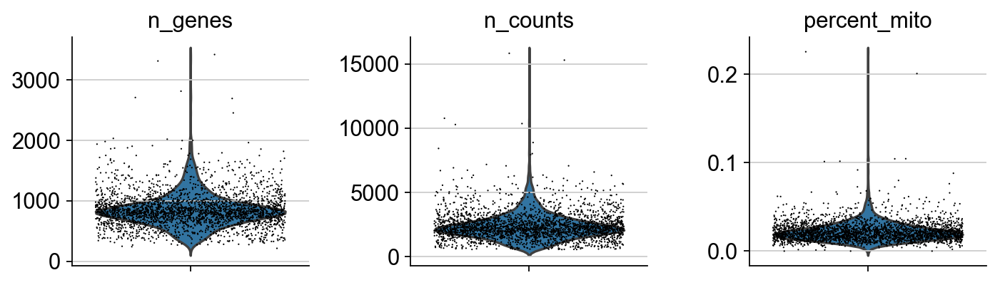

In [20]:
sc.pl.violin(adata, ['n_genes', 'n_counts', 'percent_mito'],
             jitter=0.4, multi_panel=True)

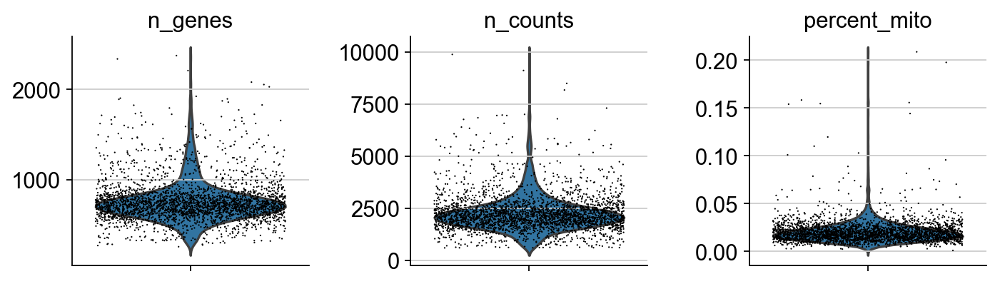

In [21]:
sc.pl.violin(adata2, ['n_genes', 'n_counts', 'percent_mito'],
             jitter=0.4, multi_panel=True)

From the plots above, and also the outputs from the previous scripts, it can be seen that the second dataset has smaller counts average for genes in general and for mito genes in particular compared to the first dataset. Also, the second dataset has higher variability in its counts than the first one.

---------------------------

In order to reduce the extreme noisy variation that affects the clustering analysis, cells that have <B>too many mitochondrial genes expressed</B> or <B>too many total counts of mito genes</B> should be removed. In order to do that, we can use the scatter plots to pick a cutoff for filtering.

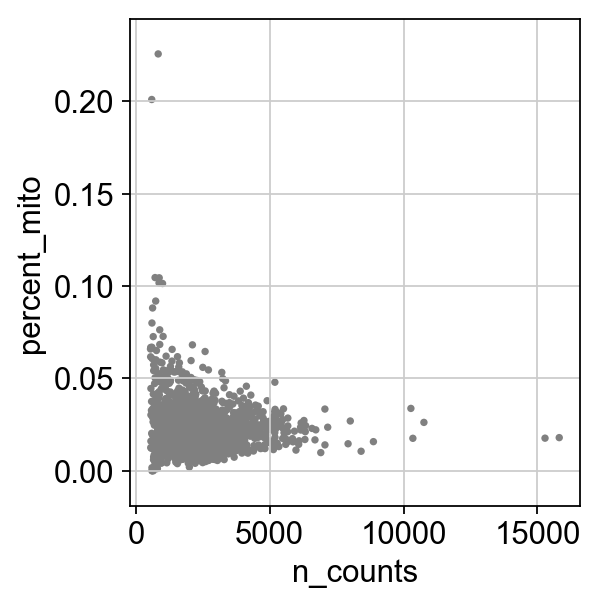

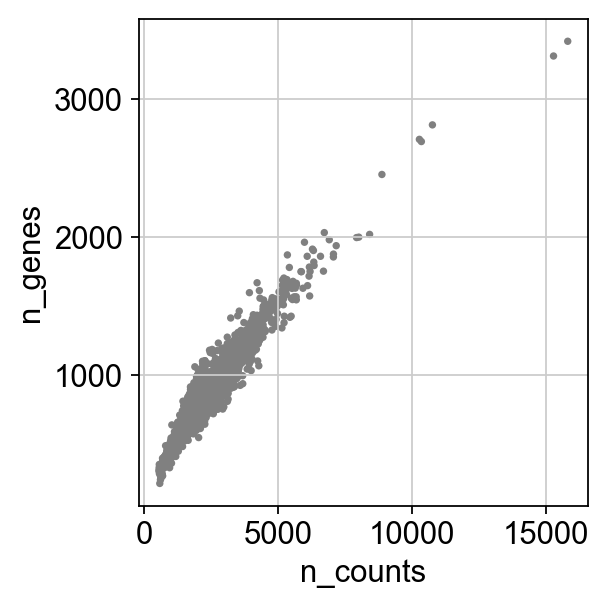

In [22]:
sc.pl.scatter(adata, x='n_counts', y='percent_mito')
sc.pl.scatter(adata, x='n_counts', y='n_genes')

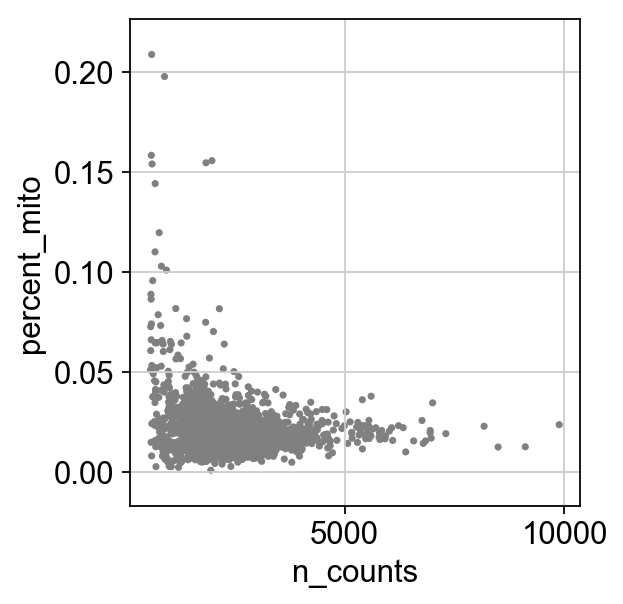

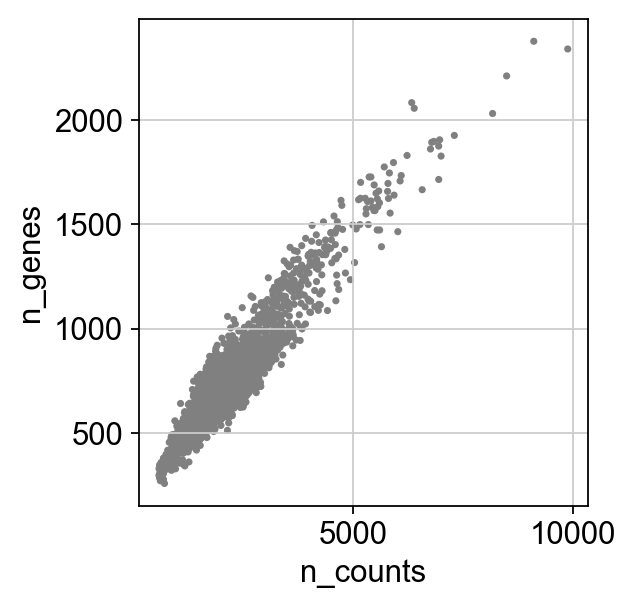

In [23]:
sc.pl.scatter(adata2, x='n_counts', y='percent_mito')
sc.pl.scatter(adata2, x='n_counts', y='n_genes')

#### Filtering Mitochondrial Genes

Before we start filtering the data using the cutoffs we picked based on the basic inspection and the plots above, there are many common ways we could try to find the outliers. For example, <B><I>interquartile range method</I></B>.

In [ ]:
from scipy.stats import iqr
#print(adata.obs['n_genes'])
def outliers_iqr(dat):
    quartile_1, quartile_3 = np.percentile(dat, [25, 75])
    iqr_ = iqr(dat) #iqr = quartile_3 - quartile_1
    print ("IQR = ", iqr_)
    print ("Q1 = ", quartile_1)
    print ("Q3 = ", quartile_3)
    lower_bound = quartile_1 - (iqr_ * 1.5)
    upper_bound = quartile_3 + (iqr_ * 1.5)
    print("---------------------")
    print ("The cutoffs are: \nlower=", lower_bound, ", upper=", upper_bound)
    return np.where((dat > upper_bound) | (dat < lower_bound))

In [ ]:
data = outliers_iqr(adata.obs['n_genes'])
print("--------------------------------------")
print("The list of outliers if we use this method: ("+str(len(data[0]))+" outliers)")
print("--------------------------------------")
print(adata.obs.iloc[data].head(5))

In [ ]:
data2 = outliers_iqr(adata2.obs['n_genes'])
print("--------------------------------------")
print("The list of outliers if we use this method: ("+str(len(data2[0]))+" outliers)")
print("--------------------------------------")
print(adata2.obs.iloc[data2].head(5))

---------------------------

The cutoffs used here are from the original notebook are applied for both datasets. As it's mentioned above, this will result in more stringent filtering for one of the datasets. The cutoff for numbers of mito genes per cell is 2500, and the threshold for the mito percentage is 0.05.

In [24]:
adata = adata[adata.obs['n_genes'] < 2500, :]
print("After filtering counts: ", adata.shape)
adata = adata[adata.obs['percent_mito'] < 0.05, :]
print("After filtering mito%: ", adata.shape)

After filtering counts:  (2695, 13714)
After filtering mito%:  (2638, 13714)


In [25]:
adata2 = adata2[adata2.obs['n_genes'] < 2500, :]
print("After filtering counts: ", adata2.shape)
adata2 = adata2[adata2.obs['percent_mito'] < 0.05, :]
print("After filtering mito%: ", adata2.shape)

After filtering counts:  (2900, 13067)
After filtering mito%:  (2849, 13067)


---------------------------

> Set the `.raw` attribute of AnnData object to the logarithmized raw gene expression for later use in differential testing and visualizations of gene expression. This simply freezes the state of the AnnData object returned by `sc.pp.log1p`. 

In [26]:
#Logarithmize the data matrix.
#Computes X = log(X + 1), where log denotes the natural logarithm.
adata.raw = sc.pp.log1p(adata, copy=True)

In [27]:
#Logarithmize the data matrix.
#Computes X = log(X + 1), where log denotes the natural logarithm.
adata2.raw = sc.pp.log1p(adata2, copy=True)

In [28]:
print(adata)

AnnData object with n_obs × n_vars = 2638 × 13714 
    obs: 'n_genes', 'percent_mito', 'n_counts'
    var: 'var_ensemble', 'n_cells'


In [29]:
print(adata2)

AnnData object with n_obs × n_vars = 2849 × 13067 
    obs: 'n_genes', 'percent_mito', 'n_counts'
    var: 'var_ensemble', 'n_cells'


### Normalization

> Per-cell normalize the data matrix $\mathbf{X}$. Many people would consider the normalized data matrix as the "relevant data" for visualization and differential testing (assessing feature importance). Until a common viewpoint is reached on this, the decision of what to consider "raw", is up to the user. We tend to recommend to use the normalized data for visualization and differential testing even though here, we use the non-normalized data for the sake of consistency with the Seurat tutorial.

In [30]:
#Normalize total counts per cell.
#Normalize each cell by total counts over all genes, 
#so that every cell has the same total count after normalization.
#counts_per_cell_after : float or None, optional (default: None)
#If None, after normalization, each cell has a total count equal to 
#the median of the counts_per_cell before normalization. why 1e4?
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)

In [31]:
#Normalize total counts per cell.
#Normalize each cell by total counts over all genes, 
#so that every cell has the same total count after normalization.
#counts_per_cell_after : float or None, optional (default: None)
#If None, after normalization, each cell has a total count equal to 
#the median of the counts_per_cell before normalization. why 1e4?
sc.pp.normalize_per_cell(adata2, counts_per_cell_after=1e4)

---------------------------

Here, we just inspect the sparse dataframe for the datasets after normalization.(If you would like to inspect the sparse dataframe of the normalized counts, unfreeze the next two code cells)

In [ ]:
#df.reset_index(drop=True, inplace=True)
#df = pd.DataFrame()
df = pd.SparseDataFrame(adata.X, index=adata.obs_names, columns=adata.var_names, copy=True)
print(df.shape)
df = pd.concat([df,pd.DataFrame(df.sum(axis=1, skipna=True),columns=['Total'])],axis=1)
df_min = pd.DataFrame(df.min(axis=0, skipna=True),columns=['Min'])
df_max = pd.DataFrame(df.max(axis=0, skipna=True),columns=['Max'])
df_mean = pd.DataFrame(df.mean(axis=0, skipna=True),columns=['Mean'])
df_std = pd.DataFrame(df.std(axis=0, skipna=True),columns=['Std'])
df_var = pd.DataFrame(df.var(axis=0, skipna=True),columns=['Var'])

df = pd.concat([df, df_min.T])
df = pd.concat([df, df_max.T])  
df = pd.concat([df, df_mean.T]) 
df = pd.concat([df, df_std.T]) 
df = pd.concat([df, df_var.T]) 
df.tail(10)

In [ ]:
#df.reset_index(drop=True, inplace=True)
#df = pd.DataFrame()
df2 = pd.SparseDataFrame(adata2.X, index=adata2.obs_names, columns=adata2.var_names, copy=True)
print (df2.shape)
df2 = pd.concat([df2,pd.DataFrame(df2.sum(axis=1, skipna=True),columns=['Total'])],axis=1)
df2_min = pd.DataFrame(df2.min(axis=0, skipna=True),columns=['Min'])
df2_max = pd.DataFrame(df2.max(axis=0, skipna=True),columns=['Max'])
df2_mean = pd.DataFrame(df2.mean(axis=0, skipna=True),columns=['Mean'])
df2_std = pd.DataFrame(df2.std(axis=0, skipna=True),columns=['Std'])
df2_var = pd.DataFrame(df2.var(axis=0, skipna=True),columns=['Var'])

df2 = pd.concat([df2, df2_min.T])
df2 = pd.concat([df2, df2_max.T])  
df2 = pd.concat([df2, df2_mean.T])
df2 = pd.concat([df2, df2_std.T]) 
df2 = pd.concat([df2, df2_var.T]) 
df2.tail(10)

### Identifying Highly-Variable Genes

Instead of selecting the cutoffs(`min_mean=0.0125`, `max_mean=3`, `min_disp=0.5`) to exract the highly variable genes, select the number of the top ranked genes `n_top_genes` to make sure enough common features are selected for analyzing the combined datasets later.

    extracting highly variable genes
    Gene indices [7854] fell into a single bin: their normalized dispersion was set to 1.
    Decreasing `n_bins` will likely avoid this effect.
        finished (0:00:00.22)


/usr/local/lib/python3.7/site-packages/scanpy/preprocessing/simple.py:357: RuntimeWarning: invalid value encountered in greater_equal
  gene_subset = df['dispersion_norm'].values >= disp_cut_off


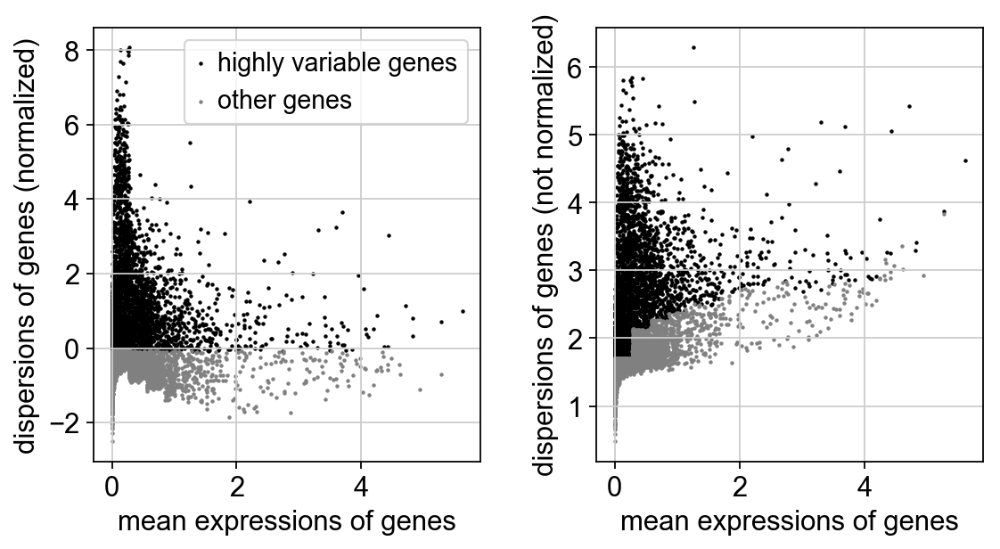

In [32]:
#Extract highly variable genes.
#If trying out parameters, pass the data matrix instead of AnnData.
#The normalized dispersion is obtained by scaling with the mean and standard deviation 
#of the dispersions for genes falling into a given bin for mean expression of genes. 
#This means that for each bin of mean expression, highly variable genes are selected.
sc.settings.verbosity = 4
filter_result = sc.pp.filter_genes_dispersion(adata.X, n_top_genes=4800) #, min_mean=0.0125, max_mean=3, min_disp=0.5
#.means, .dispersions, .dispersions_norm
#print(filter_result)
sc.pl.filter_genes_dispersion(filter_result)

    extracting highly variable genes
    Gene indices [7467, 10203] fell into a single bin: their normalized dispersion was set to 1.
    Decreasing `n_bins` will likely avoid this effect.
        finished (0:00:00.16)


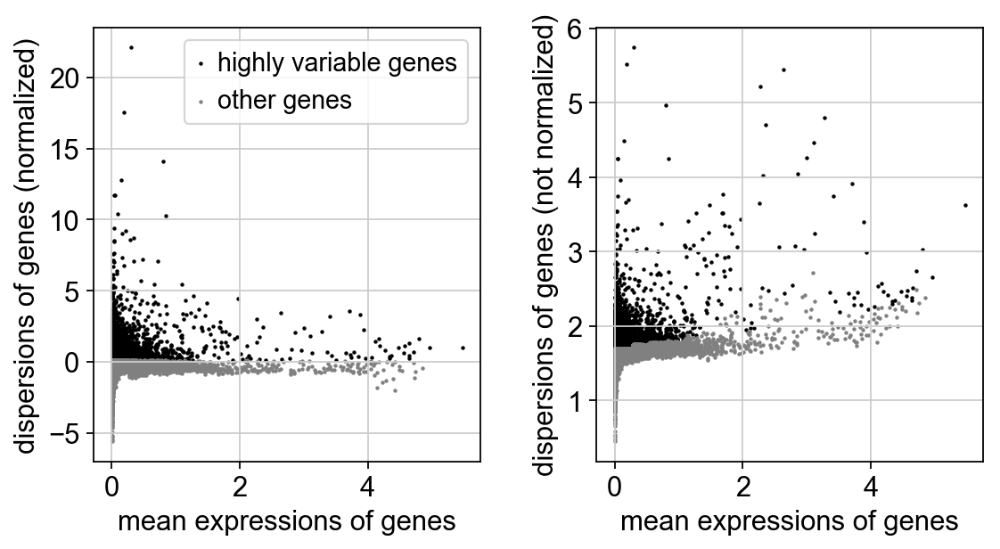

In [33]:
#Extract highly variable genes.
#If trying out parameters, pass the data matrix instead of AnnData.
#The normalized dispersion is obtained by scaling with the mean and standard deviation 
#of the dispersions for genes falling into a given bin for mean expression of genes. 
#This means that for each bin of mean expression, highly variable genes are selected.
sc.settings.verbosity = 4
filter_result2 = sc.pp.filter_genes_dispersion(adata2.X, n_top_genes=4800) #, min_mean=0.0125, max_mean=3, min_disp=0.5
#.means, .dispersions, .dispersions_norm
#print(filter_result2)
sc.pl.filter_genes_dispersion(filter_result2)

---------------------------

Before filtering the data by the subset of the highly expressed genes, let's take a look at the gene numbers.

In [34]:
tmp = adata[:, filter_result.gene_subset].var
print("# of highly expressed genes: ", len(tmp))
print(tmp.head(5))

# of highly expressed genes:  4800
             var_ensemble  n_cells
PLEKHN1   ENSG00000187583        7
ISG15     ENSG00000187608     1206
AGRN      ENSG00000188157        8
TNFRSF18  ENSG00000186891       92
TNFRSF4   ENSG00000186827      155


In [35]:
tmp2 = adata2[:, filter_result2.gene_subset].var
print("# of highly expressed genes: ", len(tmp2))
print(tmp2.head(5))

# of highly expressed genes:  4800
             var_ensemble  n_cells
KLHL17    ENSG00000187961        9
ISG15     ENSG00000187608      699
TTLL10    ENSG00000162571        3
TNFRSF18  ENSG00000186891      102
TNFRSF4   ENSG00000186827      106


Let's find out how many genes are highly variable in both datasets:

In [36]:
intersect_names = set([s.split('.')[0] for s in tmp.index]) & set([s2.split('.')[0] for s2 in tmp2.index])
print("Given the cutoffs above, the number of highly expressed genes in both datasets is: ",len(intersect_names))

intersect_ensemble = set(list(tmp['var_ensemble'])) & set(list(tmp2['var_ensemble']))
print("Given the cutoffs above, the number of highly expressed genes (ensemble) in both datasets is: ",len(intersect_ensemble))


Given the cutoffs above, the number of highly expressed genes in both datasets is:  1805
Given the cutoffs above, the number of highly expressed genes (ensemble) in both datasets is:  1799


---------------------------

The previous cutoffs from the original notebook for identifying the highly expressed genes in one dataset are too stringent to integrate the two datasets. Here we try using the parameter `n_top_genes` to select the number of top highly variable genes returned by the function for both datasets in order to increase the intersection of genes.

---------------------------

### More Processing

This section is the last one in the preprocessing step before we combine the two datasets.

#### Filtering the Data --using the list of highly expressed genes

The data is <B>filtered</B> using the list of highly variable genes extracted above.

In [37]:
adata = adata[:, filter_result.gene_subset]
print (adata)

View of AnnData object with n_obs × n_vars = 2638 × 4800 
    obs: 'n_genes', 'percent_mito', 'n_counts'
    var: 'var_ensemble', 'n_cells'


In [38]:
adata2 = adata2[:, filter_result2.gene_subset]
print (adata2)

View of AnnData object with n_obs × n_vars = 2849 × 4800 
    obs: 'n_genes', 'percent_mito', 'n_counts'
    var: 'var_ensemble', 'n_cells'


---------------------------

#### Logarithmizing the Data

In [39]:
sc.pp.log1p(adata)

In [40]:
sc.pp.log1p(adata2)

In [41]:
adata.obs.head(5)

,n_genes,percent_mito,n_counts
0,,,
AAACATACAACCAC-1,781,0.030178,2419.0
AAACATTGAGCTAC-1,1352,0.037936,4903.0
AAACATTGATCAGC-1,1131,0.008897,3147.0
AAACCGTGCTTCCG-1,960,0.017431,2639.0
AAACCGTGTATGCG-1,522,0.012245,980.0


In [42]:
adata2.obs.head(5)

,n_genes,percent_mito,n_counts
0,,,
AAACATTGCACTAG-1,1022,0.028830,2324.0
AAACATTGGCTAAC-1,633,0.017525,1826.0
AAACATTGTAACCG-1,614,0.019496,2103.0
AAACCGTGTGGTCA-1,617,0.015748,1651.0
AAACCGTGTTACCT-1,585,0.011516,1563.0


---------------------------

#### Regressing out Unwanted Source of Variation

> <B>Regress out</B> effects of total counts per cell and the percentage of mitochondrial genes expressed. Scale the data to unit variance.

In [43]:
#Regress out unwanted sources of variation.
#Uses simple linear regression.
sc.pp.regress_out(adata, ['n_counts', 'percent_mito'])
print (adata)

regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use
    finished (0:00:11.59)
AnnData object with n_obs × n_vars = 2638 × 4800 
    obs: 'n_genes', 'percent_mito', 'n_counts'
    var: 'var_ensemble', 'n_cells'


In [44]:
#Regress out unwanted sources of variation.
#Uses simple linear regression.
sc.pp.regress_out(adata2, ['n_counts', 'percent_mito'])
print (adata2)

regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use
    finished (0:00:12.28)
AnnData object with n_obs × n_vars = 2849 × 4800 
    obs: 'n_genes', 'percent_mito', 'n_counts'
    var: 'var_ensemble', 'n_cells'


---------------------------

The next two code cells are just to inspect the sparse dataframe for the normalized data. (Unfreeze it if needed)

In [ ]:
df = pd.SparseDataFrame(adata.X, index=adata.obs_names, columns=adata.var_names, copy=True)
print(df.shape)
df = pd.concat([df,pd.DataFrame(df.sum(axis=1, skipna=True),columns=['Total'])],axis=1)
df_min = pd.DataFrame(df.min(axis=0, skipna=True),columns=['Min'])
df_max = pd.DataFrame(df.max(axis=0, skipna=True),columns=['Max'])
df_mean = pd.DataFrame(df.mean(axis=0, skipna=True),columns=['Mean'])
df_std = pd.DataFrame(df.std(axis=0, skipna=True),columns=['Std'])
df_var = pd.DataFrame(df.var(axis=0, skipna=True),columns=['Var'])

df = pd.concat([df, df_min.T])
df = pd.concat([df, df_max.T])  
df = pd.concat([df, df_mean.T]) 
df = pd.concat([df, df_std.T]) 
df = pd.concat([df, df_var.T]) 
df.tail(10)

In [ ]:
df2 = pd.SparseDataFrame(adata2.X, index=adata2.obs_names, columns=adata2.var_names, copy=True)
print (df2.shape)
df2 = pd.concat([df2,pd.DataFrame(df2.sum(axis=1, skipna=True),columns=['Total'])],axis=1)
df2_min = pd.DataFrame(df2.min(axis=0, skipna=True),columns=['Min'])
df2_max = pd.DataFrame(df2.max(axis=0, skipna=True),columns=['Max'])
df2_mean = pd.DataFrame(df2.mean(axis=0, skipna=True),columns=['Mean'])
df2_std = pd.DataFrame(df2.std(axis=0, skipna=True),columns=['Std'])
df2_var = pd.DataFrame(df2.var(axis=0, skipna=True),columns=['Var'])

df2 = pd.concat([df2, df2_min.T])
df2 = pd.concat([df2, df2_max.T])  
df2 = pd.concat([df2, df2_mean.T])
df2 = pd.concat([df2, df2_std.T]) 
df2 = pd.concat([df2, df2_var.T]) 
df2.tail(10)

#### Scaling the Data

Scale the data and remove the extreme values based on the given max_value here.

In [45]:
#Scale data to unit variance and zero mean.
#The (annotated) data matrix of shape n_obs × n_vars. 
#Rows correspond to cells and columns to genes.
#max_value : float or None, optional (default: None)
#Clip (truncate) to this value after scaling. If None, do not clip.
sc.pp.scale(adata, max_value=10)

    ... clipping at max_value 10


In [46]:
#Scale data to unit variance and zero mean.
#The (annotated) data matrix of shape n_obs × n_vars. 
#Rows correspond to cells and columns to genes.
#max_value : float or None, optional (default: None)
#Clip (truncate) to this value after scaling. If None, do not clip.
sc.pp.scale(adata2, max_value=10)

    ... clipping at max_value 10


---------------------------

The next two code cells are just to inspect the sparse dataframe after scaling the data. (Unfreeze it if needed)

In [ ]:
df = pd.SparseDataFrame(adata.X, index=adata.obs_names, columns=adata.var_names, copy=True)
print(df.shape)
df = pd.concat([df,pd.DataFrame(df.sum(axis=1, skipna=True),columns=['Total'])],axis=1)
df_min = pd.DataFrame(df.min(axis=0, skipna=True),columns=['Min'])
df_max = pd.DataFrame(df.max(axis=0, skipna=True),columns=['Max'])
df_mean = pd.DataFrame(df.mean(axis=0, skipna=True),columns=['Mean'])
df_std = pd.DataFrame(df.std(axis=0, skipna=True),columns=['Std'])
df_var = pd.DataFrame(df.var(axis=0, skipna=True),columns=['Var'])

df = pd.concat([df, df_min.T])
df = pd.concat([df, df_max.T])  
df = pd.concat([df, df_mean.T]) 
df = pd.concat([df, df_std.T]) 
df = pd.concat([df, df_var.T]) 
df.tail(10)

In [ ]:
df2 = pd.SparseDataFrame(adata2.X, index=adata2.obs_names, columns=adata2.var_names, copy=True)
print (df2.shape)
df2 = pd.concat([df2,pd.DataFrame(df2.sum(axis=1, skipna=True),columns=['Total'])],axis=1)
df2_min = pd.DataFrame(df2.min(axis=0, skipna=True),columns=['Min'])
df2_max = pd.DataFrame(df2.max(axis=0, skipna=True),columns=['Max'])
df2_mean = pd.DataFrame(df2.mean(axis=0, skipna=True),columns=['Mean'])
df2_std = pd.DataFrame(df2.std(axis=0, skipna=True),columns=['Std'])
df2_var = pd.DataFrame(df2.var(axis=0, skipna=True),columns=['Var'])

df2 = pd.concat([df2, df2_min.T])
df2 = pd.concat([df2, df2_max.T])  
df2 = pd.concat([df2, df2_mean.T])
df2 = pd.concat([df2, df2_std.T]) 
df2 = pd.concat([df2, df2_var.T]) 
df2.tail(10)

Next, save the results.

In [47]:
adata.write(results_file)

In [48]:
adata2.write(results_file2)

## Combining Datasets After Scaling

We use <B><I>anndata.AnnData.concatenate --python</I></B>, to combine the two datasets after individually filtering, normalizing, and scaling the two datasets. It is probably not the ideal way to integrate two datasets with a high dimensionality. Yet, until <B>scanpy</B> implements a complex integration method, the fastest/best available way is to use Seurat, R interface, by running RunCCA (Canonical Correlation Analysis).
<br/><B><I>anndata.AnnData.concatenate (intersect)</I></B> appends the observations and returns the common variables. It adds the batch annotation, and keeps all the obs/var annotations unmerged. 

In [49]:
data_combined = adata.concatenate(adata2)
data_combined

AnnData object with n_obs × n_vars = 5487 × 1799 
    obs: 'n_genes', 'percent_mito', 'n_counts', 'batch'
    var: 'var_ensemble-0', 'n_cells-0', 'var_ensemble-1', 'n_cells-1'

In [50]:
print("The obs_names are not unique across the the datasets (before combining), there are at least the following duplicates:")
print(set(adata2.obs_names) & set(adata.obs_names))

print("\nAfter combining, the two datasets, the batch makes the samples uniques")
print("For example, this sample: AACGCATGCCTTCG-1 is found twice in the combined dataset with different batch number (which makes it distinct). Its indices are:")
print(np.where(data_combined.obs_names == 'AACGCATGCCTTCG-1-0')[0],", ",np.where(data_combined.obs_names == 'AACGCATGCCTTCG-1-1')[0])

The obs_names are not unique across the the datasets (before combining), there are at least the following duplicates:
{'CAGGGCACCATACG-1', 'GAAGGTCTGAAAGT-1', 'TCGATTTGTCGTGA-1', 'TTCACAACCCGTTC-1', 'ACTACGGACCTATT-1', 'GTCAACGACACTGA-1', 'AACGCATGCCTTCG-1', 'TATGGGTGCTAGCA-1', 'GGGAAGTGTTGAGC-1', 'CCGTACACGTTGGT-1', 'AAGATGGAGAACTC-1', 'CAACCAGATAGAAG-1'}

After combining, the two datasets, the batch makes the samples uniques
For example, this sample: AACGCATGCCTTCG-1 is found twice in the combined dataset with different batch number (which makes it distinct). Its indices are:
[68] ,  [2713]


---------------------------

In [51]:
data_combined.obs.head(5)

,n_genes,percent_mito,n_counts,batch
AAACATACAACCAC-1-0,781,0.030178,2419.0,0
AAACATTGAGCTAC-1-0,1352,0.037936,4903.0,0
AAACATTGATCAGC-1-0,1131,0.008897,3147.0,0
AAACCGTGCTTCCG-1-0,960,0.017431,2639.0,0
AAACCGTGTATGCG-1-0,522,0.012245,980.0,0


In [52]:
data_combined.var.head(5)

,var_ensemble-0,n_cells-0,var_ensemble-1,n_cells-1
ISG15,ENSG00000187608,1206,ENSG00000187608,699
TNFRSF18,ENSG00000186891,92,ENSG00000186891,102
TNFRSF4,ENSG00000186827,155,ENSG00000186827,106
ATAD3C,ENSG00000215915,9,ENSG00000215915,5
PLCH2,ENSG00000149527,3,ENSG00000149527,16


---------------------------

## PCA

In order to reduce the data dimensionality, PCA is computed and scatter plots are generated to analyze the features.

In [53]:
#Computes PCA coordinates, loadings and variance decomposition. 
#n_comps : int, optional (default: 50); Number of principal components to compute.
#zero_center : bool or None, optional (default: True); If True, compute standard PCA from covariance matrix. If False, omit zero-centering variables (uses TruncatedSVD from scikit-learn), which allows to handle sparse input efficiently.
#svd_solver : str, optional (default: ‘auto’); SVD solver to use. Either ‘arpack’ for the ARPACK wrapper in SciPy (scipy.sparse.linalg.svds), or ‘randomized’ for the randomized algorithm due to Halko (2009). ‘auto’ chooses automatically depending on the size of the problem.
#random_state : int, optional (default: 0); Change to use different intial states for the optimization.
sc.tl.pca(data_combined)

    computing PCA with n_comps = 50
        finished (0:00:00.95)     and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


In [54]:
data_combined.obsm['X_pca'] *= -1  # multiply by -1 to match Seurat

---------------------------

In the following step, we rank the genes under each single PC using pca loadings for both datasets to see if we can find any known marker genes in the PCs.

In [55]:
print(data_combined.varm['PCs'].shape)
loadings = pd.DataFrame(data_combined.varm['PCs'], index=data_combined.var_names, copy=True)
PCs_df=pd.DataFrame(index=range(1,len(data_combined.var_names)+1))
for i in range(50):
    loadings=loadings.sort_values(i, axis=0, ascending=False, kind='quicksort', na_position='last')
    PCs_df.insert(loc=i, column='PC'+str(i+1), value=list(loadings[loadings.columns[i]].index), allow_duplicates=True)
PCs_df.shape
PCs_df.head(10)

(1799, 50)


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC41,PC42,PC43,PC44,PC45,PC46,PC47,PC48,PC49,PC50
1,CST3,NKG7,CD79A,PPBP,MS4A7,IGFBP7,SERPINF1,KLRB1,CLEC10A,GZMK,...,YPEL1,POLG,SELPLG,VTI1B,CAAP1,CDK10,ARPP19,TAF1,ARIH2,KLF13
2,FCN1,CST7,MS4A1,PF4,CDKN1C,FCER1G,PPP1R14B,LTB,FCER1A,CD8B,...,CNOT4,MECR,AC006129.2,DYRK1B,PPIL3,ST6GALNAC6,CD28,TFDP2,GRPEL1,OXR1
3,LYZ,GZMA,HLA-DQA1,GNG11,FCGR3A,AKR1C3,PLD4,ALOX5AP,GZMK,RP11-291B21.2,...,NEIL1,KDM5C,MRRF,CEP78,METTL3,FH,GBF1,DEXI,CIDEB,APOBEC3C
4,S100A9,GZMB,CD79B,SDPR,CKB,KLRF1,LILRA4,DUSP1,XCL2,CCL5,...,CDK9,RORA,RRS1,ADD1,XPNPEP1,SLC7A6OS,MGST2,MIR4435-1HG,PACS1,ZNF600
5,LST1,GNLY,HLA-DPB1,SPARC,SIGLEC10,SH2D1B,LRRC26,TNFRSF18,XCL1,LYAR,...,INIP,CISD1,POU2F1,PHKB,ACADSB,VPS13A,CTD-2228K2.5,MT-CO1,CD244,RPL34
6,S100A8,PRF1,CD74,CLU,C1QA,CLIC3,MZB1,IL7R,KLRC1,XCL1,...,SNORD3B-1,P2RY10,ERLEC1,TGFB1,ARMCX3,TAF1D,TCEAL4,PILRB,HENMT1,NSDHL
7,TYMP,FGFBP2,HLA-DPA1,GP9,VMO1,SPON2,TPM2,TNFRSF4,CD1C,XCL2,...,DDX55,CD244,SMAD3,TNRC6A,PPP2CA,ISG20L2,HSPBAP1,MINA,TMEM43,MLEC
8,CFD,CTSW,TCL1A,NRGN,IFITM3,TMIGD2,IGJ,KLF6,GSN,KLRC1,...,ZNF148,TNKS2,LETM1,ANKRD54,MINA,PDRG1,CDK19,TNRC6A,SDCCAG8,TMIGD2
9,TYROBP,B2M,HLA-DRB1,TUBB1,LILRA3,CD7,ITM2C,AQP3,ID2,CTSW,...,BOD1L1,BAZ2A,PPP2R3C,CROCCP2,CBX5,UCK1,NSUN5,PEX1,BAZ2A,C1orf35
10,AIF1,CCL5,GZMB,ITGA2B,LYPD2,CHST2,SCT,XCL2,SPTSSB,MZB1,...,PATL2,RNF213,DNAJC2,TOR1AIP1,MAPK7,POLG,IRF2BPL,HEATR5B,C3orf17,RAB8B


---------------------------

Rather than inspecting the table above by eye to find any known marker, the next two code cells allow you to input one marker name (left cell) or a list of markers (right cell) and return all the PCs that contain the marker with the ranks in each PC (up to 50 PCs). <font color=red><B>Note: the numbering in the outputs is zero-based.</B></font>

In [56]:
# if you want to look for a specific gene in the previous PCs dataframe, 
#Change 'g' to the gene you are looking for.
#Note! The outputs will be zero-based.

g='PPBP'
#-------------------------------------------
print("======================================")
print("=== Looking for one Gene at a Time ===")
print("======================================")
test_df=pd.DataFrame(index=range(1,len(np.where(PCs_df == g)[0])+1))
test_df.insert(loc=0, column='gene_rank', value=list(np.where(PCs_df == g)[0]+1), allow_duplicates=True)
test_df.insert(loc=1, column='PCs', value=list(np.where(PCs_df == g)[1]+1), allow_duplicates=True)
print(g + " found in the PCs_df in "+str(test_df.shape[0]) +" PCs")
#Change it to 50 if you want to see all the rows.
test_df.head(10)

=== Looking for one Gene at a Time ===
PPBP found in the PCs_df in 50 PCs


,gene_rank,PCs
1,1,4
2,196,1
3,225,10
4,344,5
5,374,40
6,426,35
7,468,49
8,525,36
9,580,34
10,597,16


In [57]:
#-------------------------------------------
#To look up the location of a list of genes in the PCs_df, Use the following script:
#Change 'gene_list' to the list of genes you are looking for.

#you can print all the locations of 'data_combined.var_names' to see their ranks in all the PCs
#Here, I'm using a list of known markers to see if I can find any in the first PCs '0'
#Yet, this is going to print the results from all the clusters, but you can take the records with PCs# = 0
#since it is what I'm trying to look at.
genes_list = ['CD16','NKG7','PPBP','CST3','FCER1A','MS4A7','FCGR3A','MS4A1','LYZ','CD14','CD8A','IL7R','CD3D','CD3E','CD4','GNLY','GZMB','CD79A','CD79B','HBG1','HBG2']
print("==========================================")
print("======= Looking for a List of Genes ======")
print("==========================================")
for gene in list(genes_list):
    test_df=pd.DataFrame()
    if((PCs_df == gene).values.any()):
        print("------- "+gene +" -------")
        test_df.insert(loc=0, column='Rank', value=list(np.where(PCs_df == gene)[0]), allow_duplicates=True)
        test_df.insert(loc=1, column='PC#', value=list(np.where(PCs_df == gene)[1]), allow_duplicates=True)
        print(test_df.head(5),"\n")
print("==========================================\n")

======= Looking for a List of Genes ======
------- NKG7 -------
   Rank  PC#
0     0    1
1    16    9
2    17    2
3    64    8
4   268   16 

------- PPBP -------
   Rank  PC#
0     0    3
1   195    0
2   224    9
3   343    4
4   373   39 

------- CST3 -------
   Rank  PC#
0     0    0
1    39    6
2    69    8
3   207    5
4   228   10 

------- FCER1A -------
   Rank  PC#
0     1    8
1     5   10
2    18    6
3    27   13
4    41   14 

------- MS4A7 -------
   Rank  PC#
0     0    4
1    26   10
2    51    9
3    55    0
4   195    6 

------- FCGR3A -------
   Rank  PC#
0     2    4
1    13    1
2    37    2
3    37    5
4    89   10 

------- MS4A1 -------
   Rank  PC#
0     1    2
1    72    7
2    84   13
3   292   19
4   358   28 

------- LYZ -------
   Rank  PC#
0     2    0
1   222    8
2   325    5
3   424   23
4   440   10 

------- CD14 -------
   Rank  PC#
0    14    0
1    56    9
2   164    7
3   175   10
4   337   11 

------- IL7R -------
   Rank  PC#
0     5  

---------------------------

<B><font color=red>-----------------------------------------------------------------------------------------------------------------------------</font></B>

<font color=red><B>From the PCA Loadings above, </B></font>and after searching for a list of 20 markers in the PCs dataframe, we found 14 markers in the first 10 PCs with a range of ranks less than 15. 

In [ ]:
#data_combined.obs_names = ["-".join(name.split("-", 2)[:2]) for name in data_combined.obs_names]
#data_combined.obs_names_make_unique()
#data_combined.obs['batch'].keys()
#data_combined.obs_names

---------------------------

Let's inspect the PCs and find out if they correlate more with the the dataset of origin or with the cell populations. Here we plot the PC1 and PC2 (left) while grouping the data points by the batch (dataset of origin: 0=1st dataset, 1=2nd dataset).

    generating colors for batch using palette


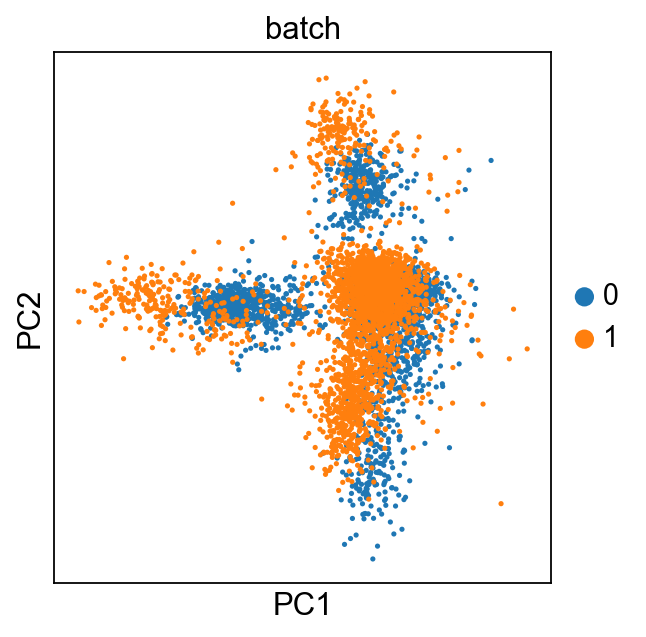

In [58]:
sc.pl.pca_scatter(data_combined, color=['batch'])

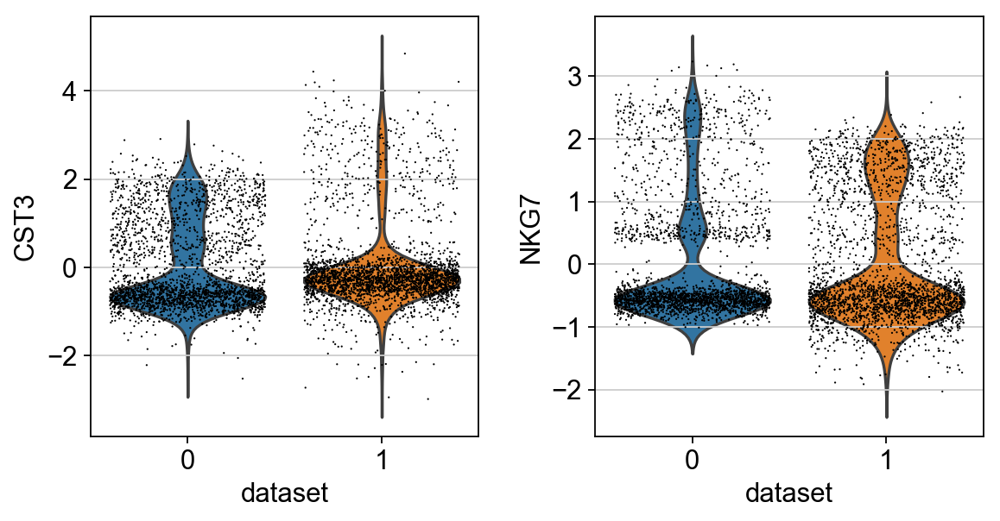

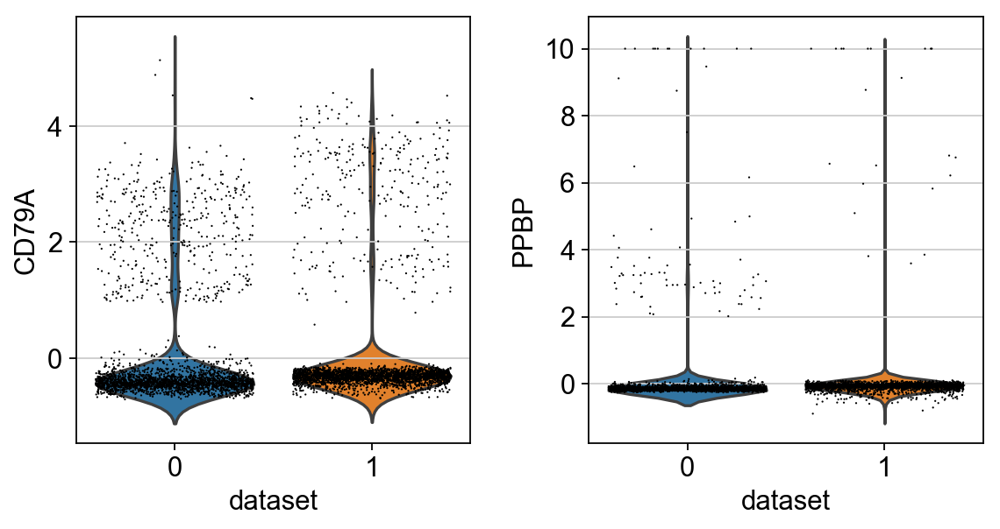

In [59]:
sc.pl.violin(data_combined,['CST3','NKG7'], groupby='batch',jitter=0.4, xlabel='dataset')
sc.pl.violin(data_combined,['CD79A','PPBP'], groupby='batch',jitter=0.4,xlabel='dataset')

---------------------------

As we can see from the plot above (left), that PC1 and PC2 separate the cells similarly in both datasets, yet the values are still shifted. We can say that PC1 and PC2 correlate more with the cell population/type than the dataset of origin.<br/>


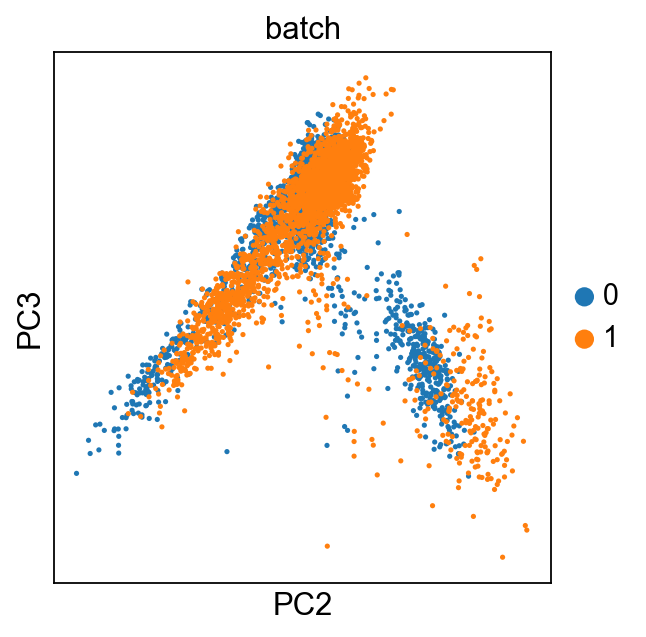

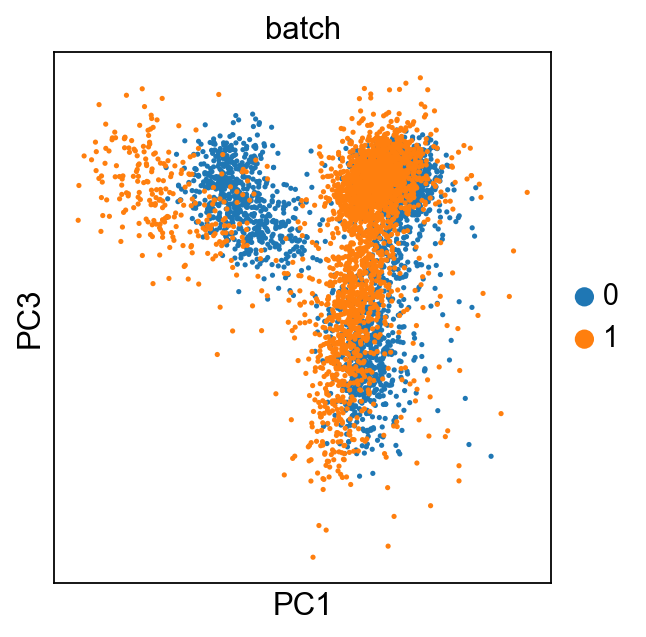

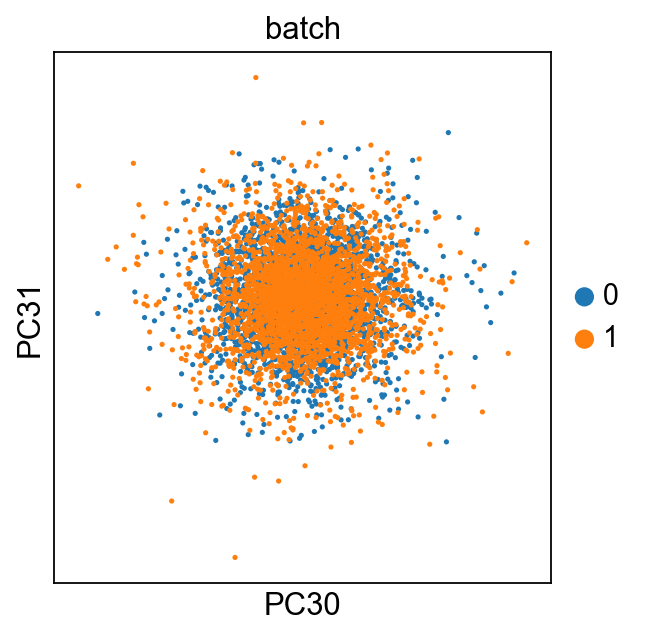

In [60]:
sc.pl.pca_scatter(data_combined, color=['batch'], components=[2,3])
sc.pl.pca_scatter(data_combined, color=['batch'], components=[1,3])
sc.pl.pca_scatter(data_combined, color=['batch'], components=[30,31])

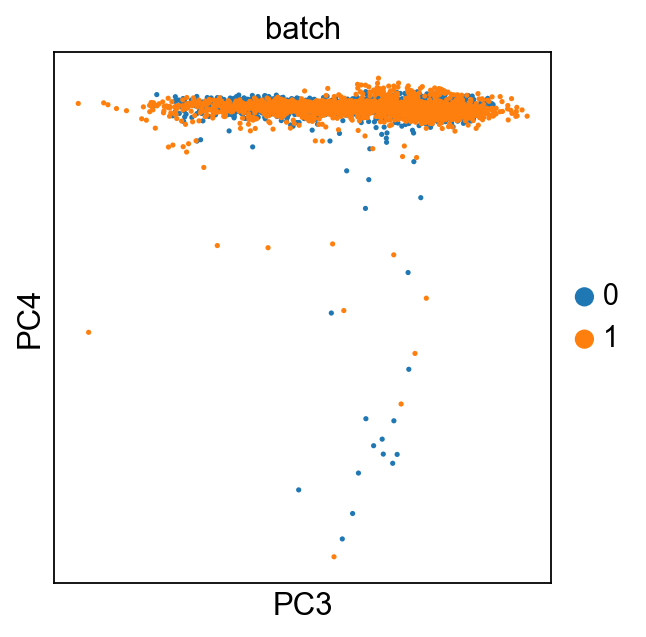

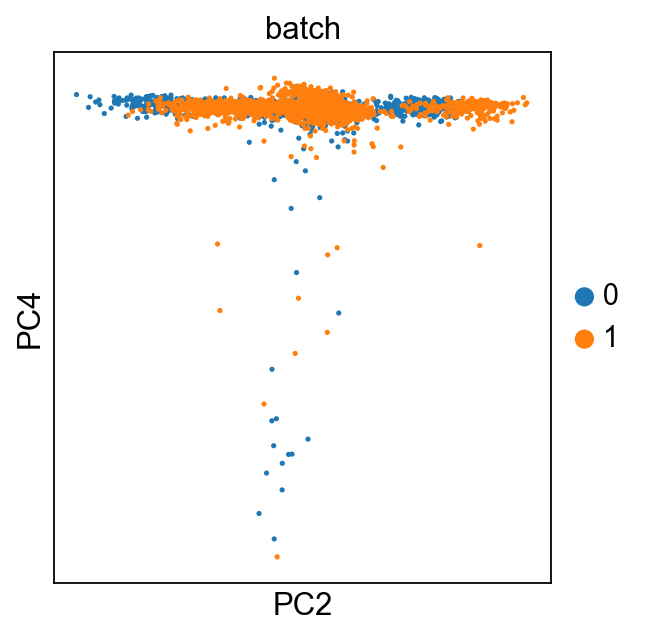

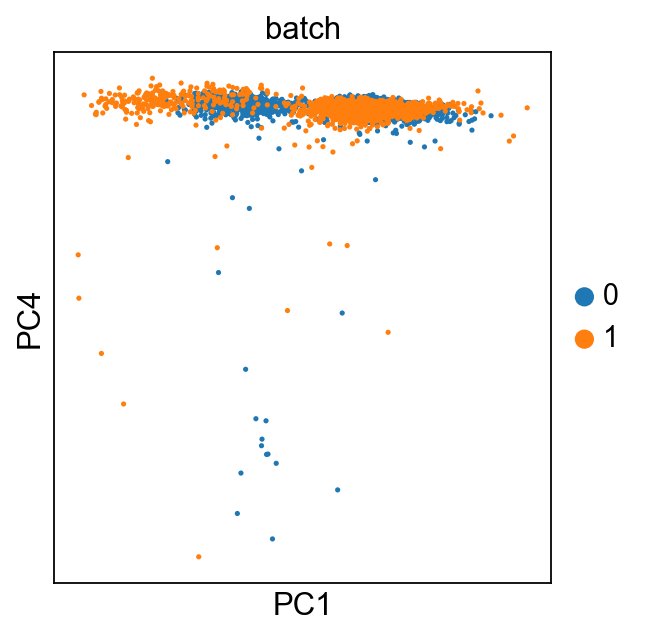

In [61]:
sc.pl.pca_scatter(data_combined, color=['batch'], components=[3,4])
sc.pl.pca_scatter(data_combined, color=['batch'], components=[2,4])
sc.pl.pca_scatter(data_combined, color=['batch'], components=[1,4])

---------------------------

<font color=blue>For further examination, the plots below give some insights about the PCs we might select for the downstream analysis.</font>

In [62]:
print (data_combined)

AnnData object with n_obs × n_vars = 5487 × 1799 
    obs: 'n_genes', 'percent_mito', 'n_counts', 'batch'
    var: 'var_ensemble-0', 'n_cells-0', 'var_ensemble-1', 'n_cells-1'
    uns: 'pca', 'batch_colors'
    obsm: 'X_pca'
    varm: 'PCs'


(5487, 50)


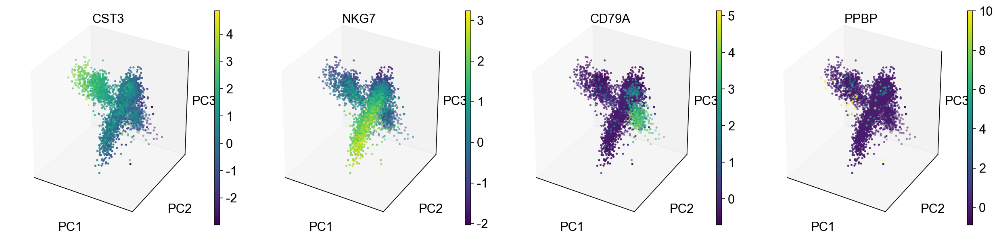

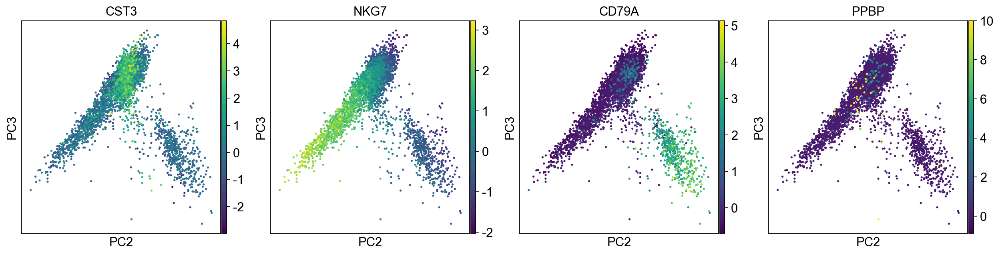

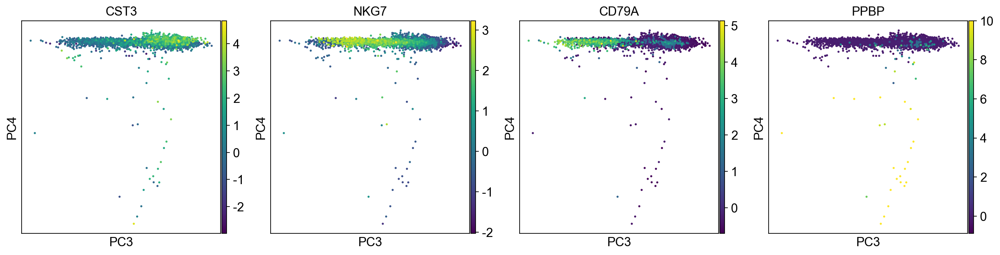

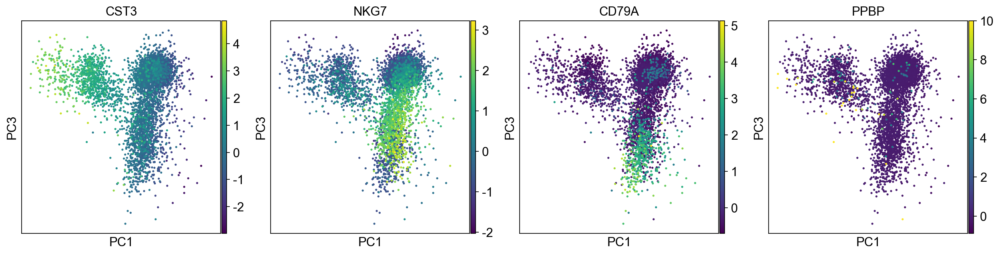

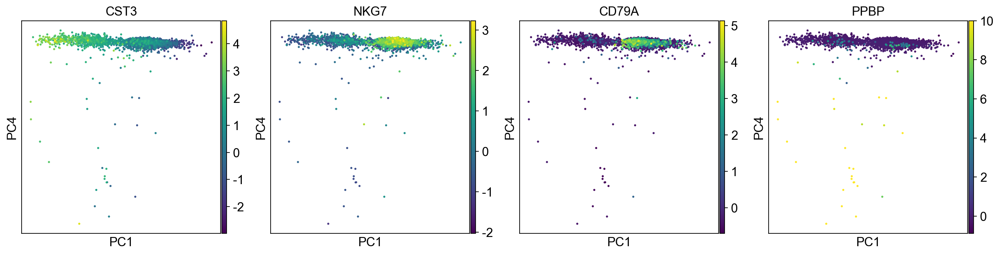

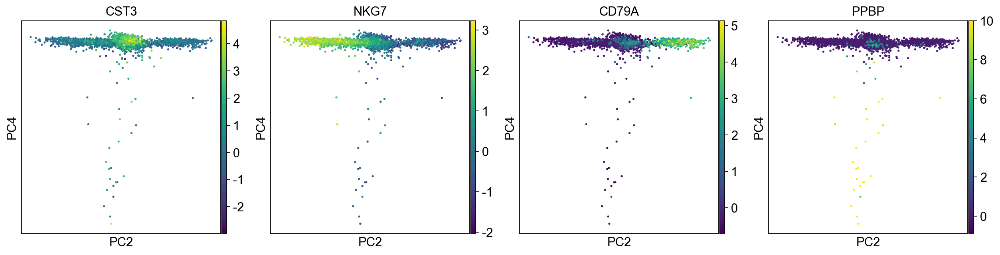

In [63]:
print (data_combined.obsm['X_pca'].shape)
sc.pl.pca_scatter(data_combined, color=['CST3','NKG7', 'CD79A', 'PPBP'],projection='3d')
sc.pl.pca_scatter(data_combined, color=['CST3','NKG7', 'CD79A', 'PPBP'],components='2,3')
sc.pl.pca_scatter(data_combined, color=['CST3','NKG7', 'CD79A', 'PPBP'],components='3,4')
sc.pl.pca_scatter(data_combined, color=['CST3','NKG7', 'CD79A', 'PPBP'],components='1,3')
sc.pl.pca_scatter(data_combined, color=['CST3','NKG7', 'CD79A', 'PPBP'],components='1,4')
sc.pl.pca_scatter(data_combined, color=['CST3','NKG7', 'CD79A', 'PPBP'],components='2,4')

---------------------------

Moreover, we can plot the gene ranks for the first four PCs as follows:

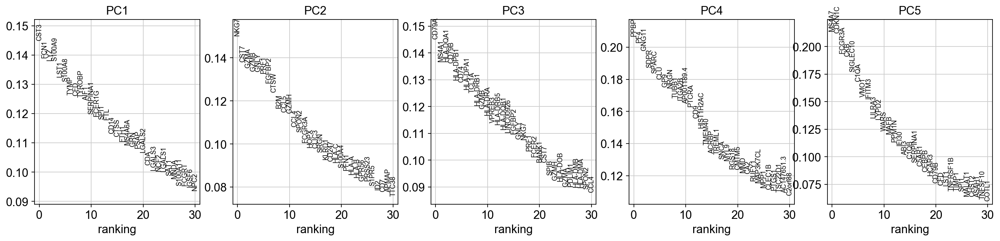

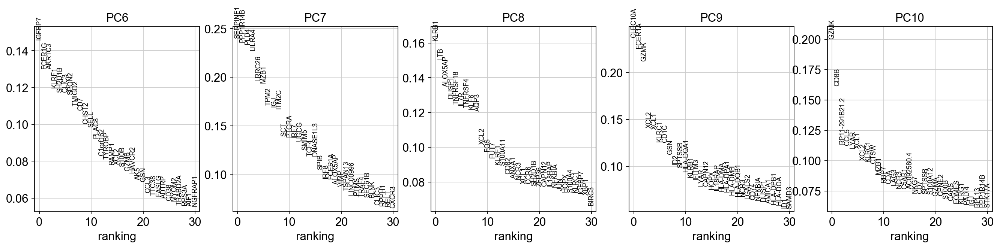

In [64]:
sc.pl.pca_loadings(data_combined, [1,2,3,4,5])
sc.pl.pca_loadings(data_combined, [6,7,8,9,10])

In order to select the number of PCs for the downstream analysis, we should look at the relationship between the number of PCs and the percentage of the variance explained. Here, we use <B><I>`pca_variance_ratio`</I></B> to measure the correlation for each PC and find an approximate number of PCs. From the plot below, we see the significant drop offs in the variance ratio from PC1 to PC11, which indicates that the PCs after PC10 are not going to affect the clustering if included for the analysis.

> Let us inspect the contribution of single PCs to the total variance in the data. This gives us information about how many PCs we should consider in order to compute the neighborhood relations of cells, e.g. used in the clustering function `sc.tl.louvain()` or tSNE `sc.tl.tsne()`. In our experience, often, a rough estimate of the number of PCs does fine. Seurat provides many more functions, here.

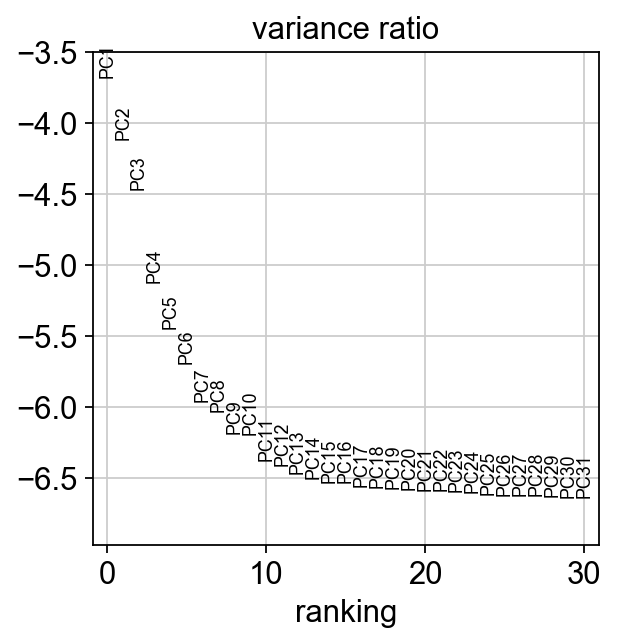

In [65]:
sc.pl.pca_variance_ratio(data_combined, log=True)

Based on the plot above, we choose 15 as the number of PCA components we use in the analysis.

In [66]:
data_combined.write(results_file)

In [67]:
data_combined

AnnData object with n_obs × n_vars = 5487 × 1799 
    obs: 'n_genes', 'percent_mito', 'n_counts', 'batch'
    var: 'var_ensemble-0', 'n_cells-0', 'var_ensemble-1', 'n_cells-1'
    uns: 'pca', 'batch_colors'
    obsm: 'X_pca'
    varm: 'PCs'

## tSNE

> We now advertise visualizing the data using UMAP, see below. In particular, if you have large data, this will give you a much faster first view of the data.

In [68]:
data_combined = sc.read(results_file)

Here, we select the first 10 PCs to include in our analysis.

In [69]:
#t-distributed stochastic neighborhood embedding (tSNE) 
#for visualizating single-cell data. 

#n_pcs : int or None, optional (default: None); Use this many PCs. 
#If n_pcs==0 use .X if use_rep is None.

#use_rep : {None, ‘X’} or any key for .obsm, optional (default: None)
#Use the indicated representation. 
#If None, the representation is chosen automatically: for .n_vars < 50, 
#.X is used, otherwise ‘X_pca’ is used. If ‘X_pca’ is not present, 
#it’s computed with default parameters.

#perplexity : float, optional (default: 30)
#The perplexity is related to the number of nearest neighbors that is used 
#in other manifold learning algorithms. 
#Larger datasets usually require a larger perplexity. 
#Consider selecting a value between 5 and 50. The choice is not extremely critical 
#since t-SNE is quite insensitive to this parameter.

#early_exaggeration : float, optional (default: 12.0)
#Controls how tight natural clusters in the original space are in the embedded space 
#and how much space will be between them. 
#For larger values, the space between natural clusters will be larger in the embedded space. 
#Again, the choice of this parameter is not very critical. 
#If the cost function increases during initial optimization, 
#the early exaggeration factor or the learning rate might be too high.

#learning_rate : float, optional (default: 1000)
#Note that the R-package “Rtsne” uses a default of 200. 
#The learning rate can be a critical parameter. 
#It should be between 100 and 1000. 
#If the cost function increases during initial optimization, 
#the early exaggeration factor or the learning rate might be too high. 
#If the cost function gets stuck in a bad local minimum increasing the learning 
#rate helps sometimes.

#random_state : int or None, optional (default: 0)
#Change this to use different intial states for the optimization. 
#If None, the initial state is not reproducible.

#use_fast_tsne : bool, optional (default: True)
#Use the MulticoreTSNE package by D. Ulyanov if it is installed.

#n_jobs : int or None (default: sc.settings.n_jobs)
#Number of jobs.

#copy : bool (default: False)
#Return a copy instead of writing to adata.
#and Return X_tsne (np.ndarray (adata.obs, dtype float)) 
#– tSNE coordinates of data.

sc.tl.tsne(data_combined, random_state=2, n_pcs=15)

computing tSNE
    using 'X_pca' with n_pcs = 15
    using the 'MulticoreTSNE' package by Ulyanov (2017)
    finished (0:00:22.94) --> added
    'X_tsne', tSNE coordinates (adata.obsm)


In [70]:
print(data_combined.obsm['X_tsne'].shape)
data_combined.obsm['X_tsne']

(5487, 2)


array([[ -9.13452616,  -8.17891302],
       [ 34.40884074,  -7.03223171],
       [ -2.37976028,   0.49466712],
       ...,
       [ -8.06773916,  31.75801131],
       [ 17.89476842, -31.065594  ],
       [ 12.38429746, -31.91424736]])

The plot below, also, shows that tSNE agrees with the general interpretation of PCA results. Both indicate that the first PCs are more correlated with the cell populations based on the expressed genes than with the dataset of origin.

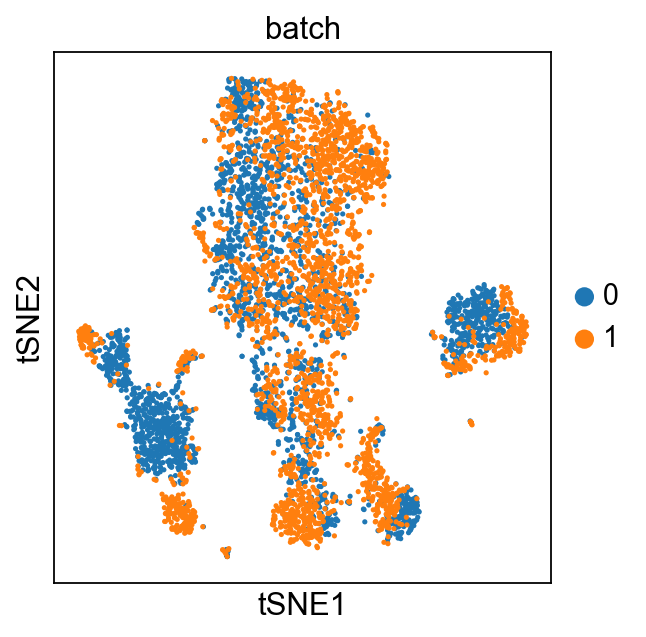

In [71]:
sc.pl.tsne(data_combined, color=['batch'])

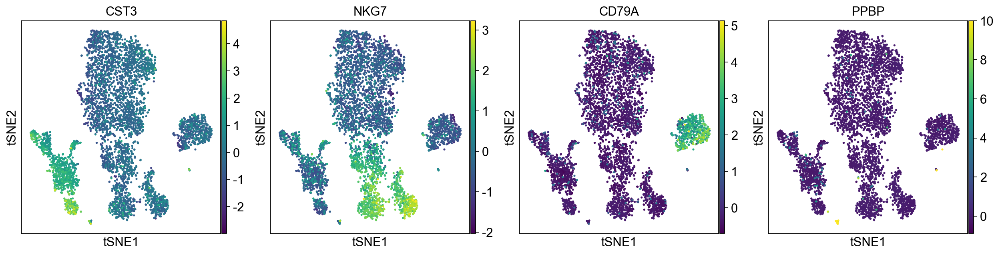

In [72]:
sc.pl.tsne(data_combined, color=['CST3','NKG7', 'CD79A', 'PPBP'])

Save the results.

In [73]:
data_combined.write(results_file)

> As we set the `.raw` attribute of AnnData (a "frozen" state of the object at a point in the pipeline where we deemed the data "raw"), the previous plots showed the raw gene expression.

--------------------------------------------------------------------------

## Computing the Neighborhood Graph

In [74]:
data_combined = sc.read(results_file)

In the next script, you can use `n_pcs` parameter to give the number of PCs that we selected from the previous sections.

In [75]:
#Compute a neighborhood graph of observations 

#n_neighbors : int
#The size of local neighborhood (in terms of number of neighboring data points) used 
#for manifold approximation. Larger values result in more global views of the 
#manifold, while smaller values result in more local data being preserved. 
#In general values should be in the range 2 to 100. If knn is True, number of nearest 
#neighbors to be searched. If knn is False, a Gaussian kernel width is set to the 
#distance of the n_neighbors neighbor.

#Return: 
#1)connectivities (sparse matrix (.uns[‘neighbors’], dtype float32)) – Weighted 
#adjacency matrix of the neighborhood graph of data points. 
#Weights should be interpreted as connectivities.
#2)distances (sparse matrix (.uns[‘neighbors’], dtype float32)) – Instead of 
#decaying weights, this stores distances for each pair of neighbors.
sc.pp.neighbors(data_combined, n_neighbors=10) 

computing neighbors
    using 'X_pca' with n_pcs = 50
    computed neighbors (0:00:00.84)
    computed connectivities (0:00:04.53)
    finished (0:00:00.00) --> added to `.uns['neighbors']`
    'distances', weighted adjacency matrix
    'connectivities', weighted adjacency matrix


### With UMAP Visualization

> "(Uniform Manifold Approximation and Projection) is a manifold learning technique for dimension reduction which is suitable for visualization of high-dimensional data. It is competitive with tSNE yet, it is faster and it arguably preserves more of the global structure." --scanpy.api.tl.umap

> Get a quick visualization of the graph using UMAP. For larger data, the speedup over tSNE will be dramatic.

In [76]:
#Embed the neighborhood graph using UMAP
#Return: X_umap (data_combined.obsm) – UMAP coordinates of data.
#n_components : int, optional (default: 2)
#The number of dimensions of the embedding.
sc.tl.umap(data_combined)

computing UMAP
	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs
    finished (0:00:09.71) --> added
    'X_umap', UMAP coordinates (adata.obsm)


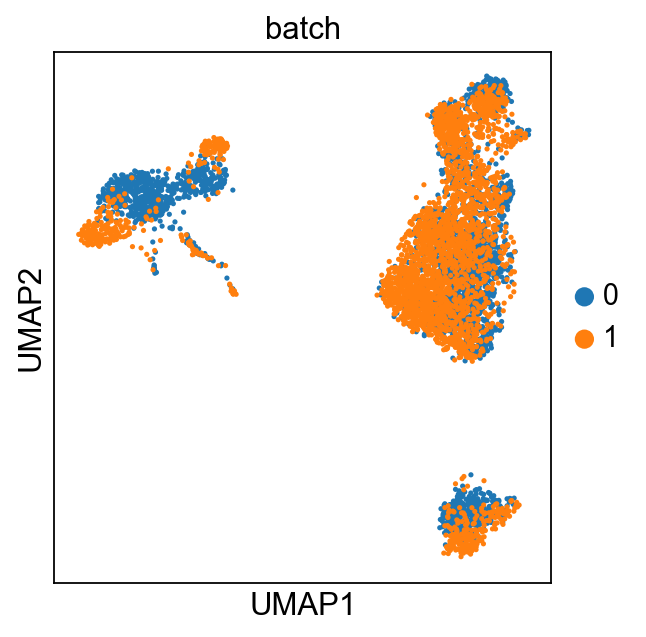

In [77]:
sc.pl.umap(data_combined, color=['batch'])

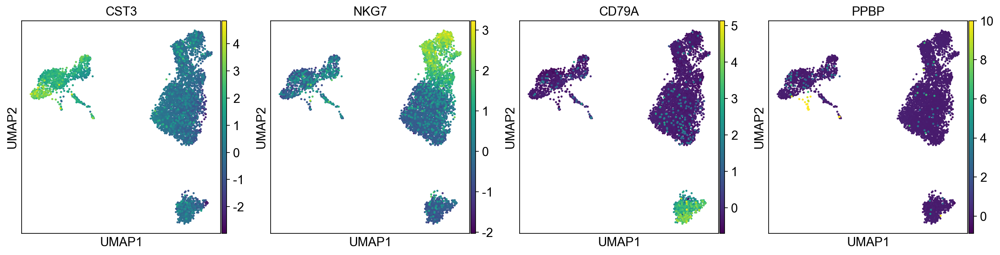

In [78]:
sc.pl.umap(data_combined, color=['CST3','NKG7', 'CD79A', 'PPBP'])

> Btw: You can also plot the scaled and corrected gene expression by explicitly stating that you don't want to use `.raw`.

In [ ]:
sc.pl.umap(data_combined, color=['CST3','NKG7', 'CD79A', 'PPBP'], use_raw=False)

## Clustering the Neighboring Graph --from tsne & umap

> As Seurat and many others, we use the Louvain graph-clustering method (community detection based on optimizing modularity). It has been proposed for single-cell data by [Levine *et al.* (2015)](https://doi.org/10.1016/j.cell.2015.05.04).

> In order to run Louvain clustering, we first need to compute the neighborhood graph of cells - we already did this in the previous section.

In [79]:
#Cluster cells into subgroups
#This requires to run neighbors(), first.

#n_neighbors:int, optional (default: 30),
#Number of neighbors to use for construction of knn graph.
#n_pcs:int, optional (default: 50)

#Return: louvain :pandas.Series (adata.obs, dtype category)
#Array of dim (number of samples) that stores the subgroup id (‘0’, ‘1’, …) 
#for each cell.

sc.tl.louvain(data_combined)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:00.52) --> found 11 clusters and added
    'louvain', the cluster labels (adata.obs, categorical)


### Visualizing Clusters Using T-SNE

Plot the data with tSNE. Coloring according to clustering. Clusters agree quite well with the result of Seurat.

    generating colors for louvain using palette


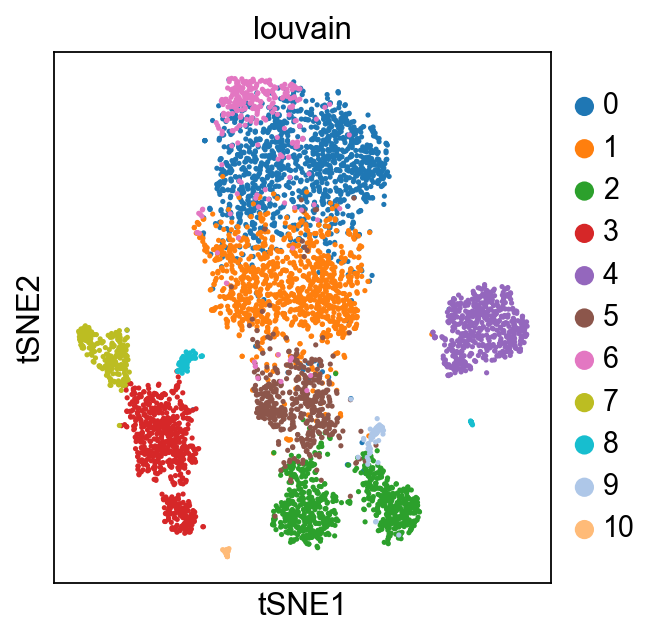

In [80]:
sc.pl.tsne(data_combined, color='louvain')
#data_combined.obs[['louvain']]

### Visualizing Clusters Using UMAP

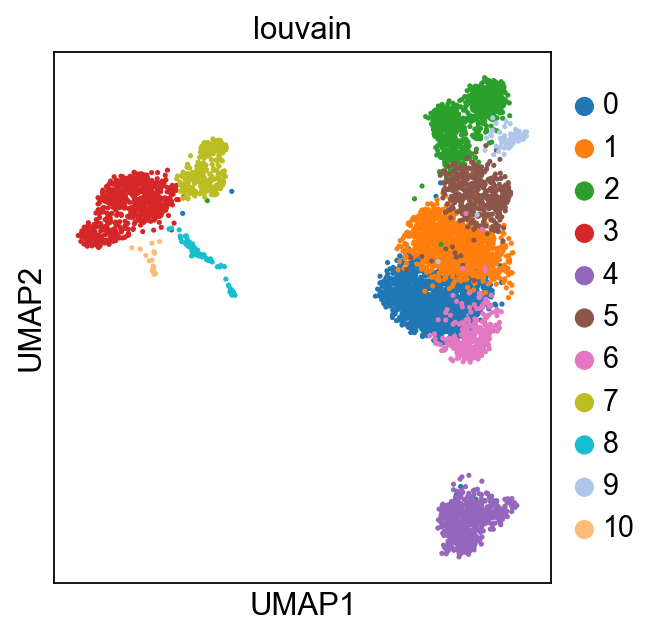

In [81]:
sc.pl.umap(data_combined, color='louvain')

In [82]:
data_combined.write(results_file)

## Finding marker genes

Let us compute a ranking for <B>the highly differential genes in each cluster</B>. Here, we simply rank genes with a <B>t-test</B>, which agrees quite well with Seurat.

For this, by default, the `.raw` attribute of AnnData is used in case it has been initialized before.

### Using Louvain with t-Test

ranking genes
    consider 'louvain' groups: ['0' '1' '2' '3' '4' '5' '6' '7' '8' '9' '10']
    with sizes: [1340 1085  729  640  552  467  273  242   78   60   21]
    finished (0:00:01.08) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
saving figure to file ./figures/rank_genes_groups_louvain_ttest-var.pdf


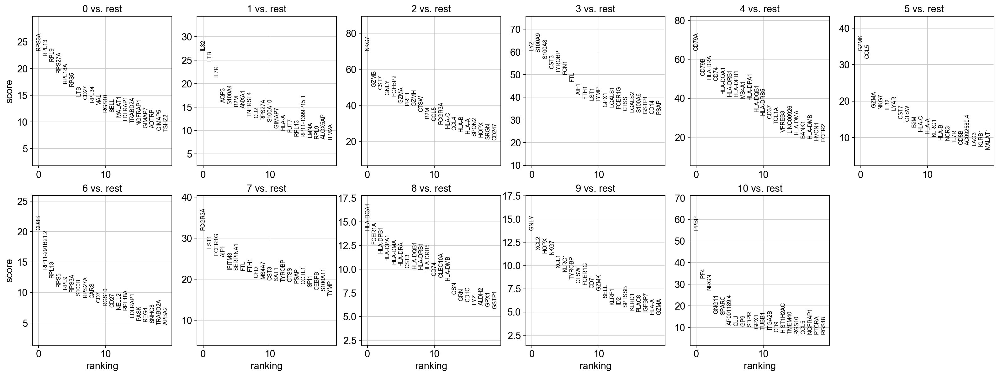

In [83]:
data_combined = sc.read(results_file)

#Rank genes for characterizing groups
#groupby : str; The key of the observations grouping to consider.
#method : {'logreg', 't-test', 'wilcoxon', 't-test_overestim_var'}, optional (default: 't-test_overestim_var')
#Return:
#Updates adata with the following fields.
#names (structured np.ndarray (.uns[‘rank_genes_groups’])) – Structured array to be indexed by group id storing 
#the gene names. Ordered according to scores.
#scores (structured np.ndarray (.uns[‘rank_genes_groups’])) – Structured array to be indexed by group id storing 
#the score for each gene for each group. Ordered according to scores.
sc.tl.rank_genes_groups(data_combined, 'louvain') #test_overestim_var

#Plot ranking of genes for all tested comparisons
#n_genes : int, optional (default: 20); Number of genes to show. Is ignored if gene_names is passed.
sc.pl.rank_genes_groups(data_combined, n_genes=20, save='_ttest-var.pdf')
data_combined.write(results_file)

Next, the rankings dataframe (Using t-test_overestim_var) is created with columns=clusters, and rows=ranks.

In [84]:
ranks_df_ttest = pd.DataFrame(data_combined.uns['rank_genes_groups']['names'])
ranks_df_ttest.head(20)

,0,1,2,3,4,5,6,7,8,9,10
0,RPS3A,IL32,NKG7,LYZ,CD79A,GZMK,CD8B,FCGR3A,HLA-DQA1,GNLY,PPBP
1,RPL13,LTB,GZMB,S100A9,CD79B,CCL5,RP11-291B21.2,LST1,FCER1A,XCL2,PF4
2,RPL9,IL7R,CST7,S100A8,HLA-DRA,GZMA,RPL13,FCER1G,HLA-DPB1,HOPX,NRGN
3,RPS27A,AQP3,GNLY,CST3,CD74,NKG7,RPS5,AIF1,HLA-DPA1,NKG7,GNG11
4,RPL18A,S100A4,FGFBP2,TYROBP,HLA-DQA1,IL32,RPL9,IFITM3,HLA-DMA,XCL1,SPARC
5,RPS5,B2M,GZMA,FCN1,HLA-DRB1,LYAR,RPS3A,SERPINA1,HLA-DRA,KLRC1,AP001189.4
6,LTB,ANXA1,PRF1,FTL,HLA-DPB1,CST7,S100B,FTL,CST3,TYROBP,CLU
7,CD27,TNFRSF4,GZMH,AIF1,MS4A1,CTSW,RPS27A,FTH1,HLA-DQB1,CTSW,GP9
8,RPL34,CD2,CTSW,FTH1,HLA-DPA1,B2M,CARS,CFD,HLA-DRB1,FCER1G,SDPR
9,MAL,RPS27A,B2M,LST1,HLA-DQB1,HLA-C,CD7,MS4A7,HLA-DRB5,CD7,GPX1


Get a table with scores and groups.

In [85]:
result = data_combined.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame({group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'scores']}).head(10)

,0_n,0_s,1_n,1_s,2_n,2_s,3_n,3_s,4_n,4_s,...,6_n,6_s,7_n,7_s,8_n,8_s,9_n,9_s,10_n,10_s
0,RPS3A,23.328522,IL32,26.983885,NKG7,70.242119,LYZ,60.498379,CD79A,64.345589,...,CD8B,20.233292,FCGR3A,31.961002,HLA-DQA1,14.111342,GNLY,13.813654,PPBP,55.064064
1,RPL13,22.402430,LTB,24.833488,GZMB,50.240772,S100A9,59.934464,CD79B,51.520607,...,RP11-291B21.2,13.850716,LST1,27.637600,FCER1A,12.665967,XCL2,11.698604,PF4,32.873363
2,RPL9,21.345392,IL7R,21.378284,CST7,48.748482,S100A8,56.975796,HLA-DRA,49.726994,...,RPL13,12.415143,FCER1G,25.849072,HLA-DPB1,11.682500,HOPX,11.359207,NRGN,27.354980
3,RPS27A,19.187346,AQP3,15.930149,GNLY,45.852348,CST3,52.599224,CD74,49.048618,...,RPS5,10.905613,AIF1,25.400301,HLA-DPA1,10.859633,NKG7,11.190680,GNG11,16.401430
4,RPL18A,17.217009,S100A4,15.612354,FGFBP2,45.051113,TYROBP,50.708908,HLA-DQA1,42.199593,...,RPL9,10.511357,IFITM3,22.418234,HLA-DMA,10.532010,XCL1,9.711253,SPARC,15.804708
5,RPS5,16.671728,B2M,15.161028,GZMA,41.352810,FCN1,50.052715,HLA-DRB1,40.988018,...,RPS3A,10.108071,SERPINA1,22.162594,HLA-DRA,10.347269,KLRC1,9.359425,AP001189.4,10.822351
6,LTB,14.824311,ANXA1,14.712171,PRF1,39.858273,FTL,46.898350,HLA-DPB1,40.752323,...,S100B,9.462366,FTL,22.087463,CST3,10.100921,TYROBP,8.546057,CLU,10.625599
7,CD27,14.222806,TNFRSF4,12.988070,GZMH,39.746895,AIF1,41.110886,MS4A1,40.035450,...,RPS27A,9.191741,FTH1,21.887226,HLA-DQB1,10.052102,CTSW,8.101825,GP9,10.612055
8,RPL34,13.653354,CD2,12.644888,CTSW,36.466812,FTH1,39.342876,HLA-DPA1,39.251923,...,CARS,9.062150,CFD,20.333979,HLA-DRB1,9.974522,FCER1G,7.938981,SDPR,10.331370
9,MAL,13.215327,RPS27A,12.253202,B2M,32.687592,LST1,38.772781,HLA-DQB1,33.100525,...,CD7,8.358762,MS4A7,20.131758,HLA-DRB5,9.827790,CD7,7.566118,GPX1,9.363495


In [86]:
sc.settings.verbosity = 2  # reduce the verbosity to no longer see hints

---------------------------

### Using Louvain with Logistic Regression

> Here, we rank genes using logistic regression. For instance, this has been suggested by [Natranos *et al.* (2018)](https://doi.org/10.1101/258566). We think that this works very well. Here, it recovers known marker genes at higer rankings than using a t-test or Wilcoxon rank sum test.

ranking genes
    finished (0:00:34.28)
saving figure to file ./figures/rank_genes_groups_louvain_logreg.pdf


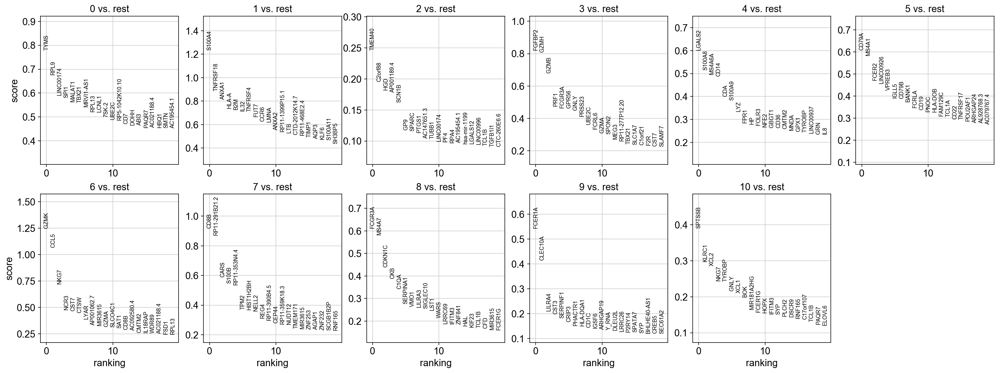

In [87]:
sc.tl.rank_genes_groups(data_combined, 'louvain', method='logreg')
#Plot ranking of genes for all tested comparisons
#n_genes : int, optional (default: 20); Number of genes to show. Is ignored if gene_names is passed.
sc.pl.rank_genes_groups(data_combined, n_genes=20, save='_logreg.pdf')

Next, the rankings dataframe (Using logistic regression) is created with columns=clusters, and rows=ranks.

In [88]:
ranks_df_logreg = pd.DataFrame(data_combined.uns['rank_genes_groups']['names'])
ranks_df_logreg.head(20)

,0,1,2,3,4,5,6,7,8,9,10
0,TYMS,S100A4,TMEM40,FGFBP2,LGALS2,CD79A,GZMK,CD8B,FCGR3A,FCER1A,SPTSSB
1,RPL9,TNFRSF18,C2orf88,GZMH,S100A8,MS4A1,CCL5,RP11-291B21.2,MS4A7,CLEC10A,KLRC1
2,LINC00174,ANXA1,HGD,GZMB,MS4A6A,FCER2,NKG7,CARS,CDKN1C,LILRA4,XCL2
3,SPI1,HLA-A,AP001189.4,PRF1,CD14,LINC00926,NCR3,S100B,CKB,CST3,NKG7
4,MALAT1,B2M,SCN1B,FCGR3A,CDA,VPREB3,CST7,RP11-353N4.4,C1QA,SERPINF1,TYROBP
5,TBX21,IL32,GP9,GPR56,S100A9,IGLL5,CTSW,TPM2,SERPINA1,CRIP3,GNLY
6,MRVI1-AS1,TNFRSF4,SPARC,GNLY,LYZ,CD79B,LYAR,HIST1H2BH,VMO1,PHACTR1,XCL1
7,RPL13,FUT7,PTGS1,PRSS23,FPR1,BANK1,AP001062.7,NELL2,LILRA3,HLA-DQA1,BOK
8,LCNL1,CCR6,AC147651.3,UBE2C,HP,FCRLA,MIR3615,REG4,SIGLEC10,CD1C,MIR181A2HG
9,7SK-2,LMNA,TUBB1,FCRL6,FOLR3,CD19,GZMA,RP11-390B4.5,LST1,IGSF6,FCER1G


Get a table with scores and groups.

In [89]:
result = data_combined.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame({group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'scores']}).head(10)

,0_n,0_s,1_n,1_s,2_n,2_s,3_n,3_s,4_n,4_s,...,6_n,6_s,7_n,7_s,8_n,8_s,9_n,9_s,10_n,10_s
0,TYMS,0.778574,S100A4,1.232441,TMEM40,0.246063,FGFBP2,0.820097,LGALS2,0.600989,...,GZMK,1.247757,CD8B,0.917441,FCGR3A,0.611303,FCER1A,0.542864,SPTSSB,0.390093
1,RPL9,0.676116,TNFRSF18,0.886015,C2orf88,0.195504,GZMH,0.809642,S100A8,0.514835,...,CCL5,1.064737,RP11-291B21.2,0.871894,MS4A7,0.581655,CLEC10A,0.414401,KLRC1,0.297334
2,LINC00174,0.590690,ANXA1,0.812692,HGD,0.182304,GZMB,0.680763,MS4A6A,0.495502,...,NKG7,0.721026,CARS,0.588784,CDKN1C,0.438762,LILRA4,0.210420,XCL2,0.285275
3,SPI1,0.580769,HLA-A,0.739022,AP001189.4,0.178232,PRF1,0.475323,CD14,0.487618,...,NCR3,0.475857,S100B,0.546232,CKB,0.388102,CST3,0.198631,NKG7,0.243731
4,MALAT1,0.563532,B2M,0.727682,SCN1B,0.162116,FCGR3A,0.463776,CDA,0.400209,...,CST7,0.466048,RP11-353N4.4,0.536168,C1QA,0.342432,SERPINF1,0.181520,TYROBP,0.242719
5,TBX21,0.558952,IL32,0.714477,GP9,0.118113,GPR56,0.462927,S100A9,0.383856,...,CTSW,0.447348,TPM2,0.370250,SERPINA1,0.275428,CRIP3,0.166656,GNLY,0.216934
6,MRVI1-AS1,0.541954,TNFRSF4,0.712054,SPARC,0.116172,GNLY,0.449745,LYZ,0.334561,...,LYAR,0.388774,HIST1H2BH,0.368880,VMO1,0.263042,PHACTR1,0.152450,XCL1,0.210183
7,RPL13,0.521518,FUT7,0.667162,PTGS1,0.113726,PRSS23,0.412639,FPR1,0.284718,...,AP001062.7,0.331377,NELL2,0.361079,LILRA3,0.260154,HLA-DQA1,0.151380,BOK,0.199312
8,LCNL1,0.521101,CCR6,0.626456,AC147651.3,0.104035,UBE2C,0.362314,HP,0.279185,...,MIR3615,0.326697,REG4,0.310908,SIGLEC10,0.255330,CD1C,0.144110,MIR181A2HG,0.164966
9,7SK-2,0.499519,LMNA,0.621298,TUBB1,0.103497,FCRL6,0.332719,FOLR3,0.273093,...,GZMA,0.319645,RP11-390B4.5,0.297626,LST1,0.247573,IGSF6,0.141017,FCER1G,0.157273


---------------------------

### Comparisons, Analysis, Visualization

<center><B><font color=red>---------------------------------------- For testing purposes! Don't run! ------------------------------------------</font></B></center>
<br/>If you would like to look up a gene or a list of genes in the rank_gene_groups dataframes (either `ranks_df_ttest` or `ranks_df_logreg`) above, use the following scripts. Let's try to find the markers in the `ranks_df_logreg` dataframe first, and then we can compare the results with `ranks_df_ttest` dataframe.
<br/><font color=red><B>Note: The outputs are zero-based to match the dataframes above.</B></font>

In [90]:
#To find the location of a gene in the clusters, Use the following script:
#Change 'g' to the gene you are looking for.
#Note! The outputs will be zero-based.
g='MS4A1'
ranks_df = ranks_df_ttest # you can pick which ranks dataframe you want to search either: ranks_df_ttest or ranks_df_logreg
print("======================================")
print("=== Looking for one Gene at a Time ===")
print("======================================")
print(g + "\n-----")
test_df=pd.DataFrame()
test_df.insert(loc=0, column='Rank', value=list(np.where(ranks_df == g)[0]), allow_duplicates=True)
test_df.insert(loc=1, column='Cluster#', value=list(np.where(ranks_df == g)[1]), allow_duplicates=True)
print(test_df,"\n")

=== Looking for one Gene at a Time ===
MS4A1
-----
   Rank  Cluster#
0     7         4 



In [91]:
#-------------------------------------------
#To look up the location of a list of genes in the clusters, Use the following script:
#Change 'gene_list' to the list of genes you are looking for.

#you can print all the locations of 'data_combined.var_names' to see their ranks in all the clusters
#Here, I'm using a list of known markers to see if I can find any in the first cluster '0'
#Yet, this is going to print the results from all the clusters, but you can take the records with cluster# = 0
#since it is what I'm trying to look at.
genes_list = ['CD16','NKG7','PPBP','CST3','FCER1A','MS4A7','FCGR3A','MS4A1','LYZ','CD14','CD8A','IL7R','CD3D','CD3E','CD4','GNLY','GZMB','CD79A','CD79B','HBG1','HBG2']
ranks_df2 = ranks_df_ttest # you can pick which ranks dataframe you want to search either: ranks_df_ttest or ranks_df_logreg
print("=====================================")
print("==== Looking for a List of Genes ====")
print("=====================================")
for gene in list(genes_list):
    temp_df=pd.DataFrame()
    if((ranks_df2 == gene).values.any()):
        print("------- "+gene +" -------")
        temp_df.insert(loc=0, column='Rank', value=list(np.where(ranks_df2 == gene)[0]), allow_duplicates=True)
        temp_df.insert(loc=1, column='Cluster#', value=list(np.where(ranks_df2 == gene)[1]), allow_duplicates=True)
        print(temp_df.head(5),"\n")#,temp_df,"\n")
print("======================================\n")

==== Looking for a List of Genes ====
------- NKG7 -------
   Rank  Cluster#
0     0         2
1     3         5
2     3         9 

------- PPBP -------
   Rank  Cluster#
0     0        10 

------- CST3 -------
   Rank  Cluster#
0     3         3
1     6         8
2    10         7
3    64        10 

------- FCER1A -------
   Rank  Cluster#
0     1         8 

------- MS4A7 -------
   Rank  Cluster#
0     9         7 

------- FCGR3A -------
   Rank  Cluster#
0     0         7
1    11         2 

------- MS4A1 -------
   Rank  Cluster#
0     7         4 

------- LYZ -------
   Rank  Cluster#
0     0         3
1    16         8
2    54         7 

------- CD14 -------
   Rank  Cluster#
0    18         3
1    95        10 

------- IL7R -------
   Rank  Cluster#
0     2         1
1    14         5
2    23         0
3    30         6 

------- GNLY -------
   Rank  Cluster#
0     0         9
1     3         2 

------- GZMB -------
   Rank  Cluster#
0     1         2
1    32         8

---------------------------

<center><B><font color=red>-----------------------------------------------------------------------------------------------------------------------------</font></B></center>

<B>From the pervious sections, and the scripts above, we found out that 14 known marker genes are recovered. 8 out of 14 are recovered with a slightly higher ranks using <I><U>logreg</U></I> while the other 6 markers ranked slightly higher using <I><U>t-test_overestimate_var</U></I>. The table below shows all the marker genes recovered and their ranks in the clusters. The difference in the ranks between the two methods for all the marker genes is relatively small except for IL7R, which is found by <I><U>t-test_overestimate_var</U></I> at rank 2 while it ranked 35 by logreg.</B>

Louvain Group | Markers(logreg) | Cell Type | Markers(t-test) | Cell Type
---|---|---
0 | xxxxxxx | xxxxxxx | IL7R(23) | CD4 T cells
1 | IL7R(35) | CD4 T cells | IL7R(2) | CD4 T cells
2 | xxxxxxx | xxxxxxx | NKG7(0), GZMB(1), GNLY(3), <S>FCGR3A(11)</S> | Erythroblasts (mixture of natural killer cells and CD8+ T cells)
3 |	GZMB(2), FCGR3A(4), GNLY(6) | Cytotoxic/CD8 T Cells | LYZ(0), CST3(3), CD14(18) | Dendritic cells ?? CD14+CD16 Monocytes
4 |	CD14(3), LYZ(6) | CD14+CD16 Monocytes | CD79A(0), CD79B(1), MS4A1(7) | B cells
5 |	CD79A(0), MS4A1(1), CD79B(6) | B cells | NKG7(3), IL7R(14) | NK cells ?? CD4 T cells
6 |	NKG7(2) | NK cells | xxxxxxx | xxxxxxx
7 |	xxxxxxx | xxxxxxx | FCGR3A(0), MS4A7(9), CST3(10) | FCGR3A+ Monocytes ??? <S>Dendritic cells</S>
8 |	FCGR3A(0), MS4A7(1) | FCGR3A+ Monocytes | FCER1A(1), CST3(6),<S>LYZ(16)</S> | Dendritic cells
9 |	FCER1A(0), CST3(3) | Dendritic cells | GNLY(0), NKG7(3) | NK cells
10 | NKG7(3), GNLY(5) | NK cells| PPBP(0) | Megakaryocytes

Compare to a single cluster. 

ranking genes
    finished (0:00:00.05)


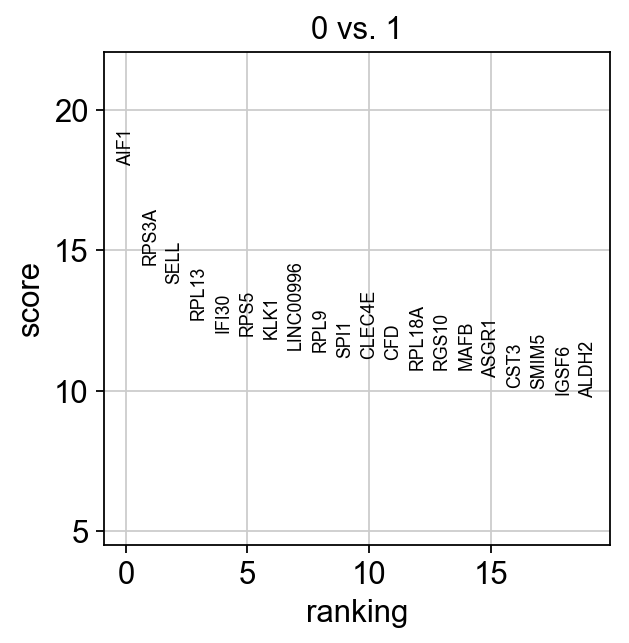

In [92]:
data_combined = sc.read(results_file)
sc.tl.rank_genes_groups(data_combined, 'louvain', groups=['0'], reference='1')
sc.pl.rank_genes_groups(data_combined, groups=['0'], n_genes=20)

> If we want a more detailed view for a certain group, use `sc.pl.rank_genes_groups_violin`.

> Reread the examples that were computed by comparing to the rest of the groups.

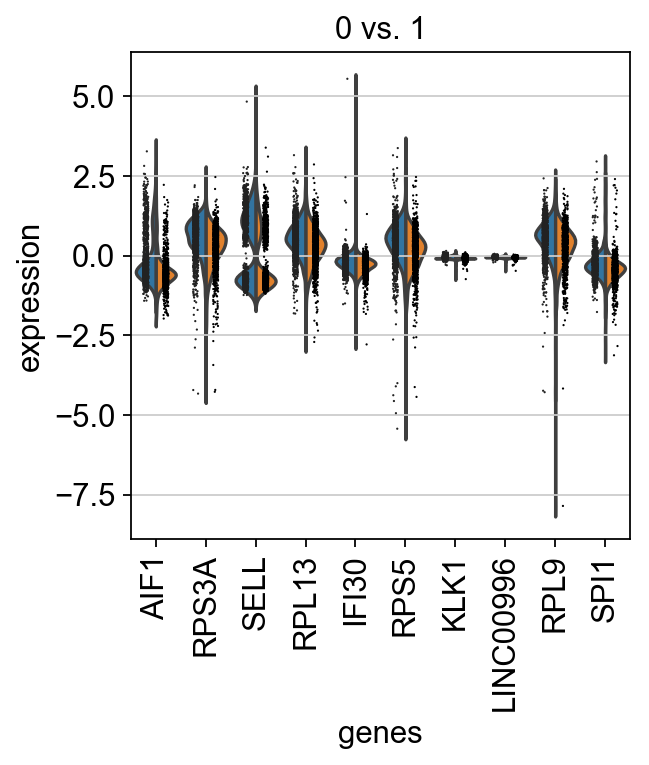

In [93]:
#Plot ranking of genes for all tested comparisons.
#groups : list of str, optional (default: None); List of group names.
#n_genes : int, optional (default: 20); Number of genes to show. Is ignored if gene_names is passed.
sc.pl.rank_genes_groups_violin(data_combined, groups='0', n_genes=10)

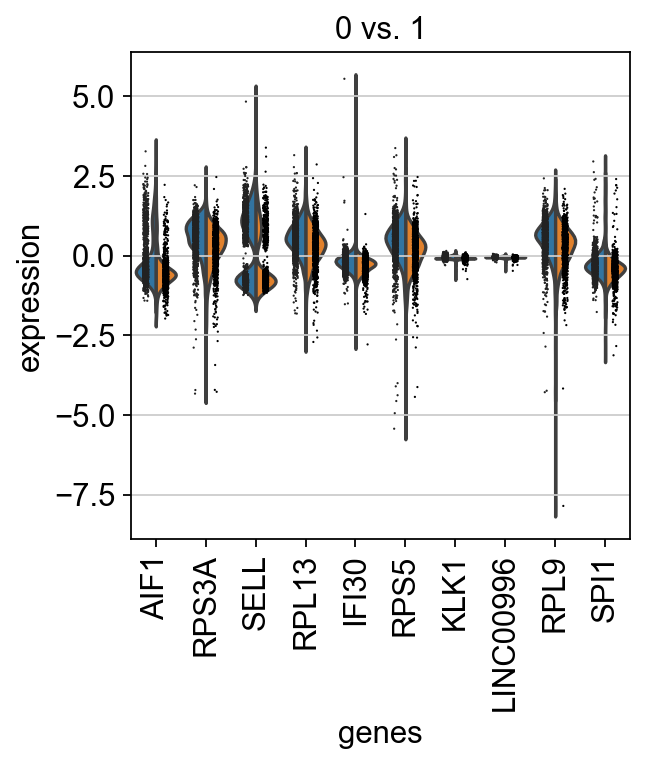

In [94]:
#data_combined = sc.read(results_file)
sc.pl.rank_genes_groups_violin(data_combined, groups='0', n_genes=10)

---------------------------

<B>Let's compare the results from <I><U>logreg</U></I> and <I><U>t-test_overestimate_var</U></I> in the following table again with the plots below.</B>

Louvain Group | Markers(logreg) | Cell Type
---|---|---
0 | xxxxxxx | xxxxxxx 
1 | IL7R(35) | CD4 T cells 
2 | xxxxxxx | xxxxxxx 
3 |	GZMB(2), FCGR3A(4), GNLY(6) | Cytotoxic/CD8 T Cells 
4 |	CD14(3), LYZ(6) | CD14+CD16 Monocytes 
5 |	CD79A(0), MS4A1(1), CD79B(6) | B cells 
6 |	NKG7(2) | NK cells 
7 |	xxxxxxx | xxxxxxx 
8 |	FCGR3A(0), MS4A7(1) | FCGR3A+ Monocytes 
9 |	FCER1A(0), CST3(3) | Dendritic cells 
10 | NKG7(3), GNLY(5) | NK cells

Louvain Group | Markers(t-test-var) | Cell Type
---|---|---
0 | IL7R(23) | CD4 T cells
1 | IL7R(2) | CD4 T cells
2 | NKG7(0), GZMB(1), GNLY(3), <S>FCGR3A(11)</S> | Erythroblasts
3 |	LYZ(0), CST3(3), CD14(18) | <S>Dendritic cells</S>/CD14+CD16 Monocytes
4 | CD79A(0), CD79B(1), MS4A1(7) | B cells
5 | NKG7(3), IL7R(14) | NK cells/CD4 T cells
6 | xxxxxxx | xxxxxxx
7 | FCGR3A(0), MS4A7(9), CST3(10) | FCGR3A+ Monocytes/<S>Dendritic cells</S>
8 | FCER1A(1), CST3(6),<S>LYZ(16)</S> | Dendritic cells
9 | GNLY(0), NKG7(3) | NK cells
10 | PPBP(0) | Megakaryocytes

We can validate from the plots below and the table above (t-test_overestimate_var) the marker genes that highly expressed the cells in each cluster. For example, let's pick one of the clusters and try to find its marker genes from the plots below. Take a look at cluster#4 in the plots across all marker genes. We can see that CD79A(rank=0), CD79B(rank=1), MS4A1(rank=7) are the highly expressed marker genes compared to the others in cluster 4.

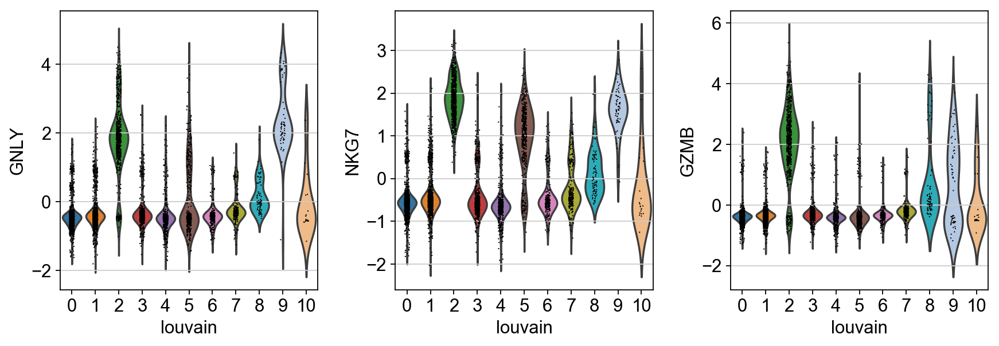

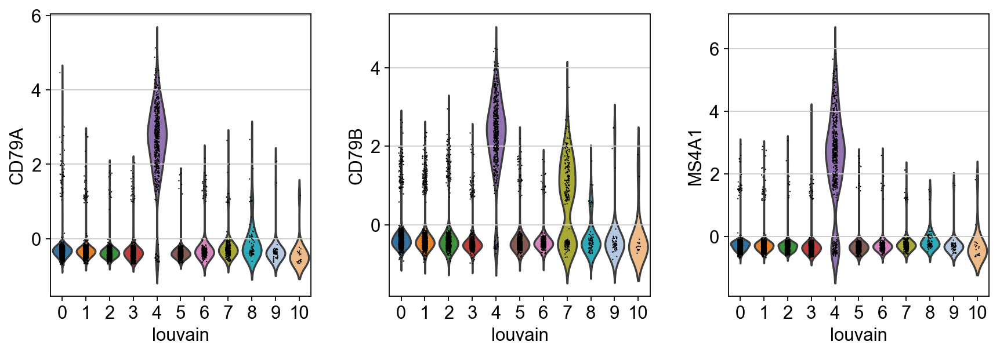

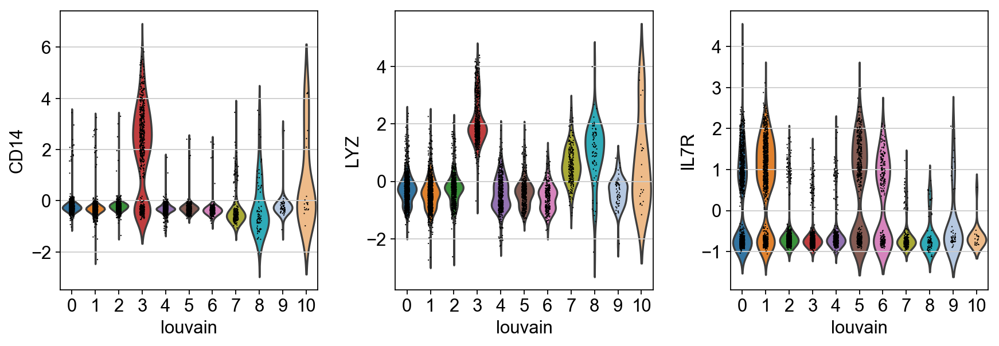

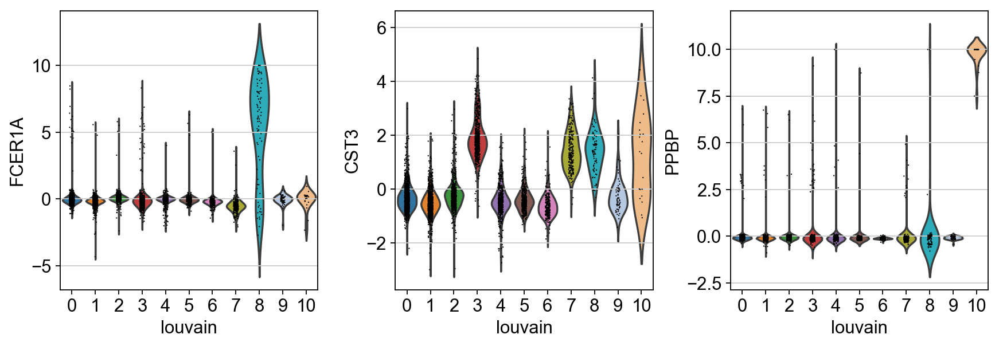

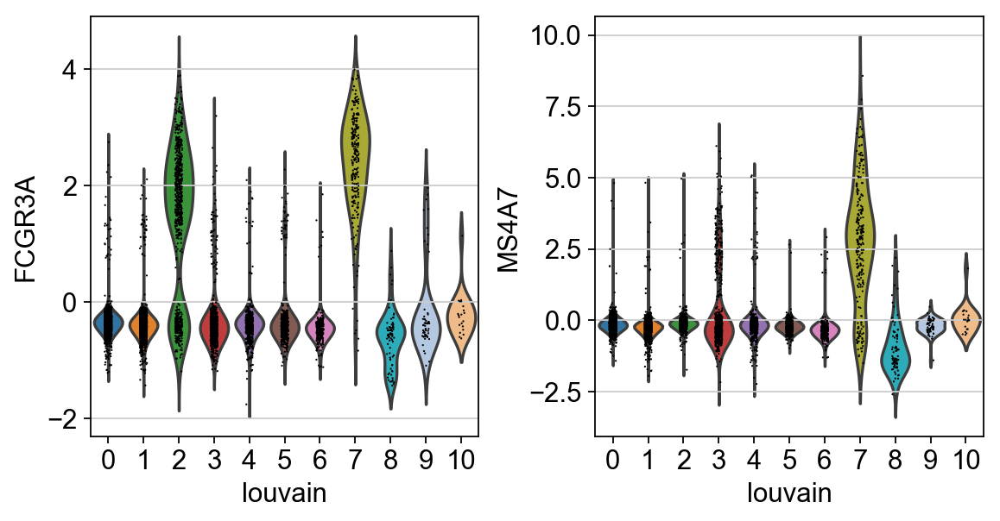

In [95]:
data_combined = sc.read(results_file)
sc.pl.violin(data_combined, ['GNLY', 'NKG7', 'GZMB'], groupby='louvain', method=' t-test_overestimate_var')
sc.pl.violin(data_combined, ['CD79A', 'CD79B', 'MS4A1'], groupby='louvain', method=' t-test_overestimate_var')
sc.pl.violin(data_combined, ['CD14', 'LYZ', 'IL7R'], groupby='louvain', method=' t-test_overestimate_var')
sc.pl.violin(data_combined, ['FCER1A', 'CST3','PPBP'], groupby='louvain', method=' t-test_overestimate_var')
sc.pl.violin(data_combined, ['FCGR3A', 'MS4A7'], groupby='louvain', method=' t-test_overestimate_var')

---------------------------

Actually mark the cell types.

In [96]:
new_cluster_names = [
    '0 | CD4 T cells', 'CD4 T cells', 'Erythroblasts', 'CD14+CD16 Monocytes', 'B cells', 
    'CD4 T cells|NK cells', '6', 'FCGR3A+ Monocytes', 'Dendritic cells', 'NK cells', 
    'Megakaryocytes']
data_combined.rename_categories('louvain', new_cluster_names)

In [97]:
data_combined.uns['rank_genes_groups']['names'].dtype

dtype([('0 | CD4 T cells', '<U50'), ('CD4 T cells', '<U50'), ('Erythroblasts', '<U50'), ('CD14+CD16 Monocytes', '<U50'), ('B cells', '<U50'), ('CD4 T cells|NK cells', '<U50'), ('6', '<U50'), ('FCGR3A+ Monocytes', '<U50'), ('Dendritic cells', '<U50'), ('NK cells', '<U50'), ('Megakaryocytes', '<U50')])

saving figure to file ./figures/tsne.pdf


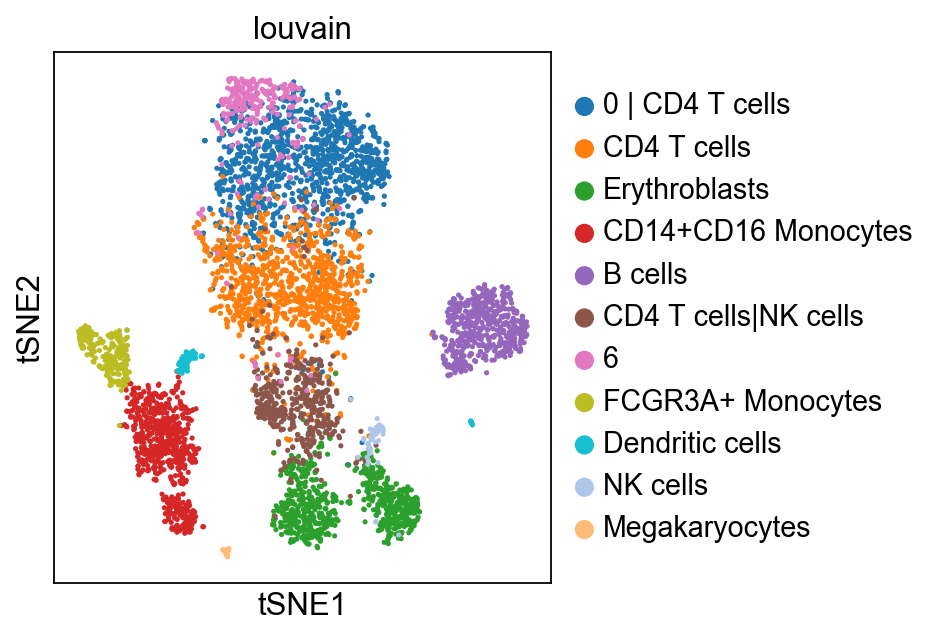

In [98]:
sc.pl.tsne(data_combined, color='louvain', legend_loc='right margin', save='.pdf')

saving figure to file ./figures/umap.pdf


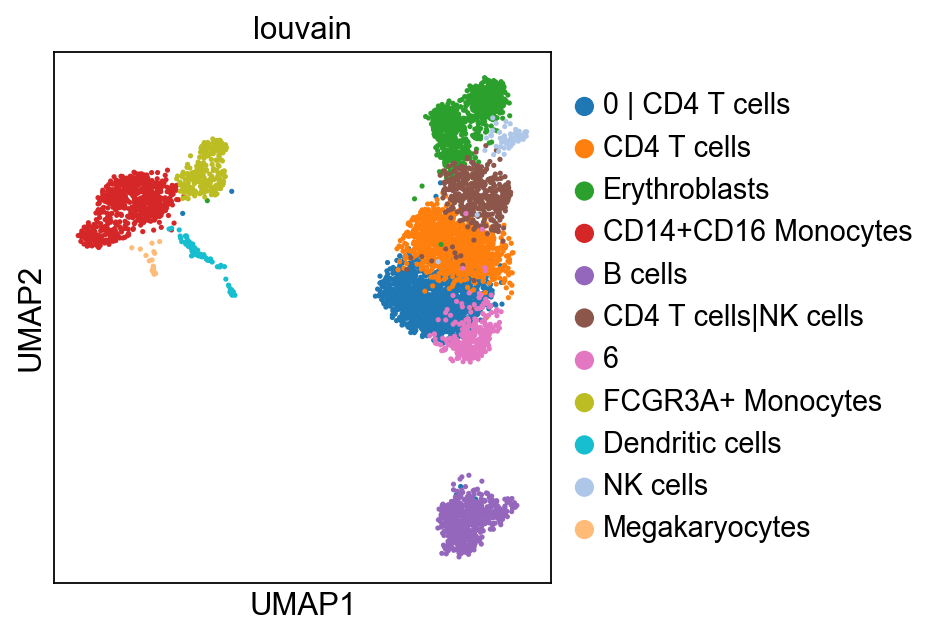

In [99]:
sc.pl.umap(data_combined, color='louvain', legend_loc='right margin', save='.pdf')

saving figure to file ./figures/violin_1.pdf


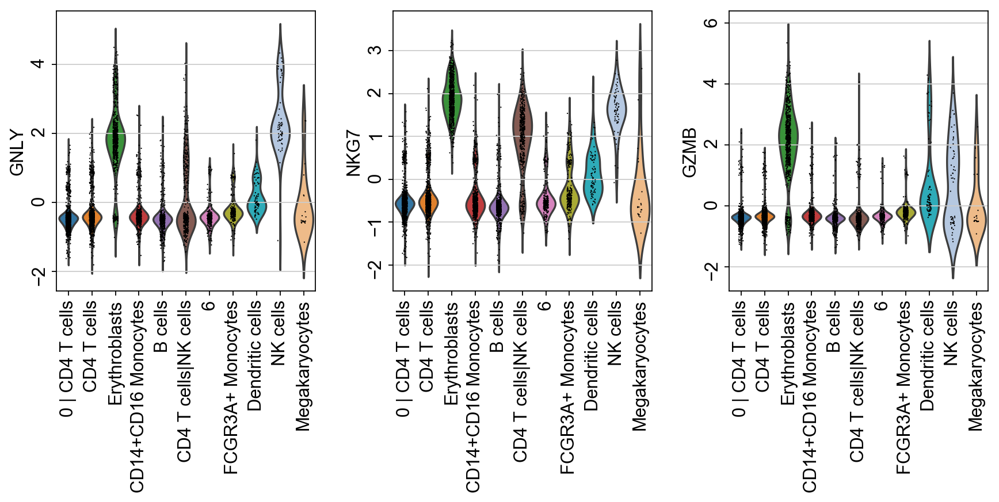

saving figure to file ./figures/violin_2.pdf


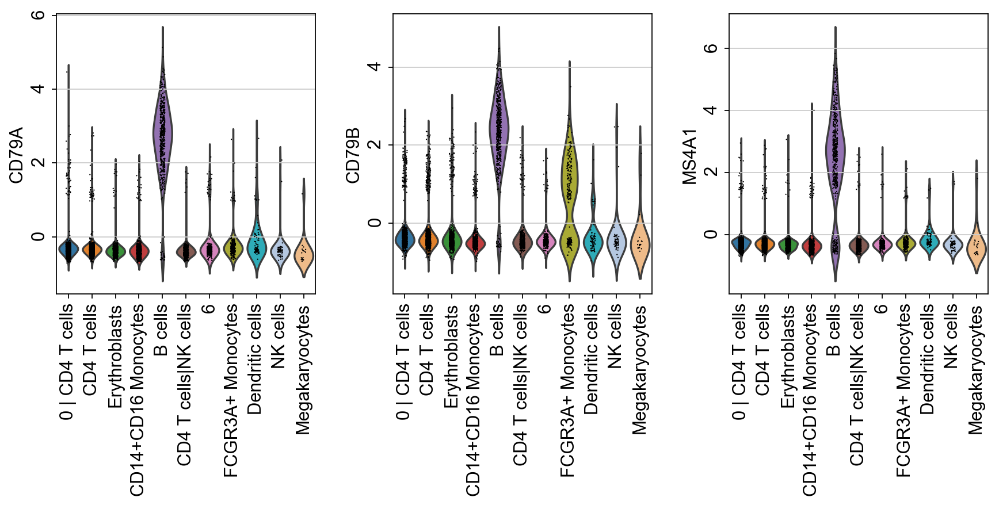

saving figure to file ./figures/violin_3.pdf


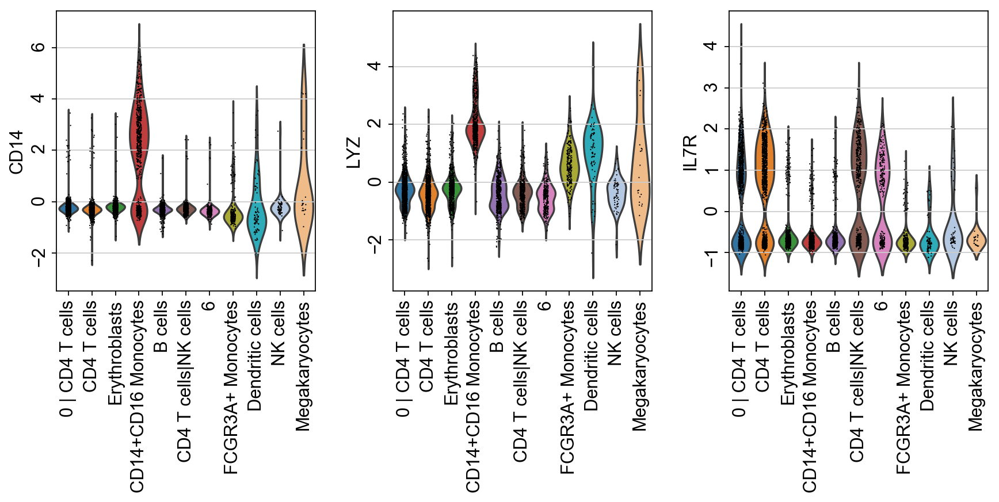

saving figure to file ./figures/violin_4.pdf


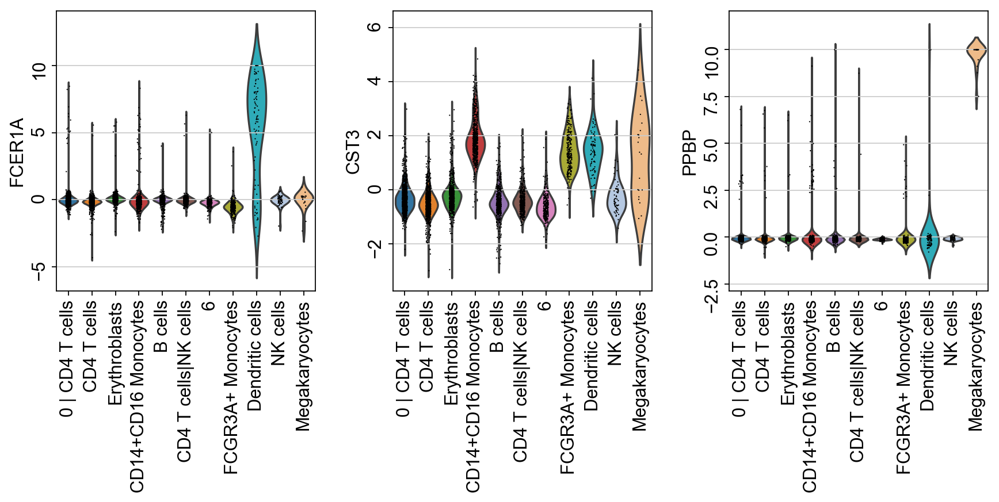

saving figure to file ./figures/violin_5.pdf


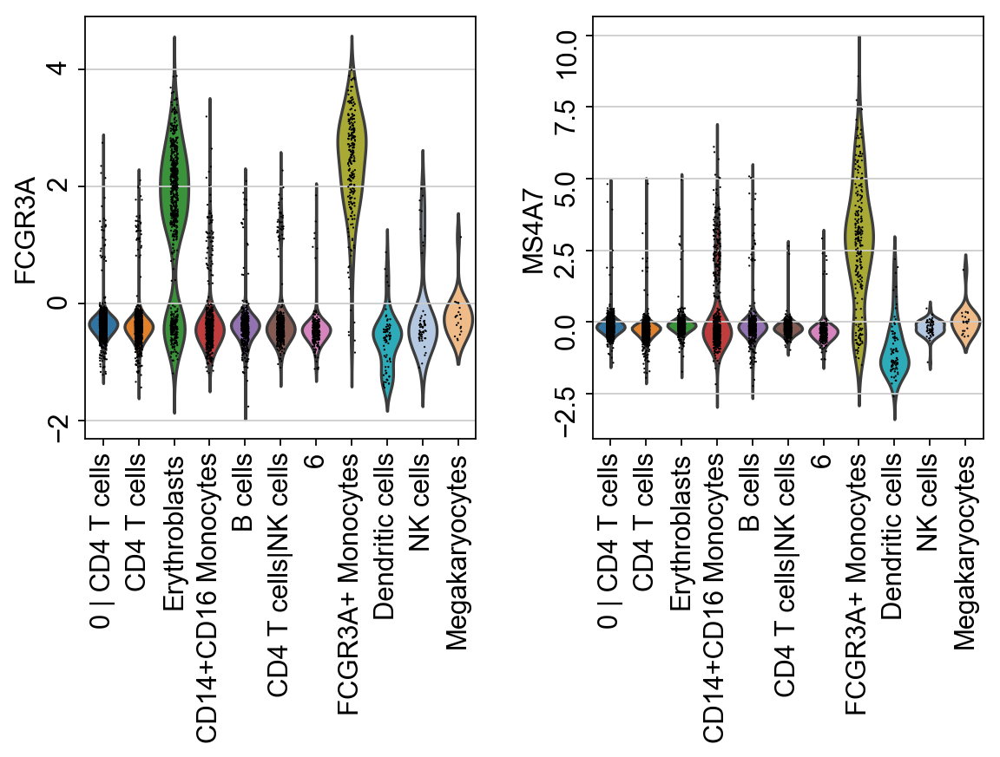

In [100]:
sc.pl.violin(data_combined, ['GNLY', 'NKG7', 'GZMB'], groupby='louvain', method=' t-test_overestimate_var', rotation=90, save='_1.pdf')
sc.pl.violin(data_combined, ['CD79A', 'CD79B', 'MS4A1'], groupby='louvain', method=' t-test_overestimate_var', rotation=90, save='_2.pdf')
sc.pl.violin(data_combined, ['CD14', 'LYZ', 'IL7R'], groupby='louvain', method=' t-test_overestimate_var', rotation=90, save='_3.pdf')
sc.pl.violin(data_combined, ['FCER1A', 'CST3','PPBP'], groupby='louvain', method=' t-test_overestimate_var', rotation=90, save='_4.pdf')
sc.pl.violin(data_combined, ['FCGR3A', 'MS4A7'], groupby='louvain', method=' t-test_overestimate_var', rotation=90, save='_5.pdf')

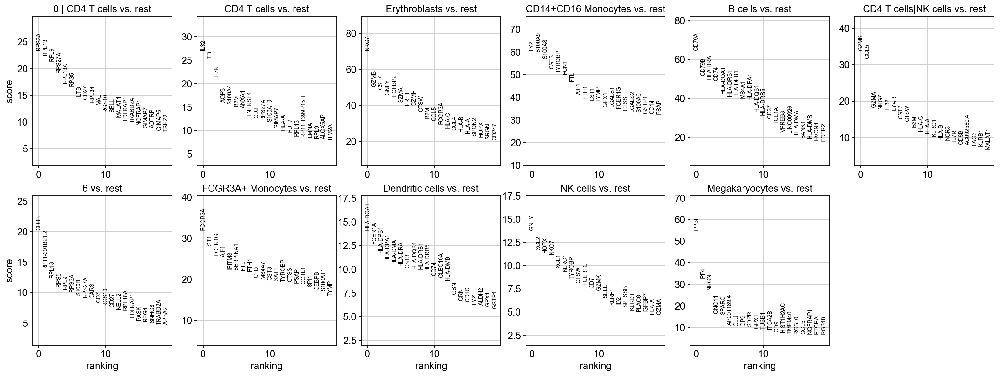

In [101]:
sc.pl.rank_genes_groups(data_combined, n_genes=20)

Our AnnData now accumlated the following annotations.

In [102]:
data_combined

AnnData object with n_obs × n_vars = 5487 × 1799 
    obs: 'n_genes', 'percent_mito', 'n_counts', 'batch', 'louvain'
    var: 'var_ensemble-0', 'n_cells-0', 'var_ensemble-1', 'n_cells-1'
    uns: 'batch_colors', 'louvain', 'louvain_colors', 'neighbors', 'pca', 'rank_genes_groups'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'

In [103]:
data_combined.write(results_file)

Get a rough overview of the file using `h5ls`, which has many options - for more details see [here](https://github.com/theislab/scanpy_usage/blob/master/170505_seurat/info_h5ad.md). The file format might still be subject to further optimization in the future. All reading functions will remain backwards-compatible, though.

In [104]:
!h5ls './write/pmbc3k.h5ad'

X                        Dataset {2638, 1838}
obs                      Dataset {2638}
obsm                     Dataset {2638}
raw.X                    Group
raw.var                  Dataset {13714}
uns                      Group
var                      Dataset {1838}
varm                     Dataset {1838}


If you want to share this file with people who merely want to use it for visualization, a simple way to reduce the file size is by removing the dense scaled and corrected data matrix.

In [105]:
data_combined.X = None
data_combined.write('./write/pmbc3k_withoutX.h5ad')

If you want to export to "csv", you have the following options:

In [106]:
# Export single fields of the annotation of observations
# adata.obs[['n_counts', 'louvain_groups']].to_csv(
#     './write/pbmc3k_corrected_louvain_groups.csv')

# Export single columns of the multidimensional annotation
# adata.obsm.to_df()[['X_pca1', 'X_pca2']].to_csv(
#     './write/pbmc3k_corrected_X_pca.csv')

# Or export everything except the data using `.write_csvs`.
# Set `skip_data=False` if you also want to export the data.
# adata.write_csvs(results_file[:-5], )

## Questions

<font color=red><B>1) Do similar cell types cluster together? Or do they cluster more on dataset?</B> <br/></font>

<font color=blue>Yes. Similar cell types cluster together as shown in the plot below. For example, Monocytes cells cluster relatively together. Looking at <B><font color=red>CD14+CD16 Monocytes</font></B> and <B><font color=#9acd32>FCGR3A+ Monocytes</font></B>, it can be clearly seen that similar cell types in cluster together. They are both isolated on in a group of two clusters on the left. Also, <B><font color=#b0c4de>NK cells</font></B> and <B><font color=green>Erythroblasts cells</font></B> (basically a mixture of natural killer cells and CD8+ T cells) share some marker genes such as: GNLY and NKG7 and they cluster at the bottom of the plot next to each other.<br/> From the plot on the right while comparing it with the one on the left, we can confirm that cell types do not cluster more on dataset. </font> 

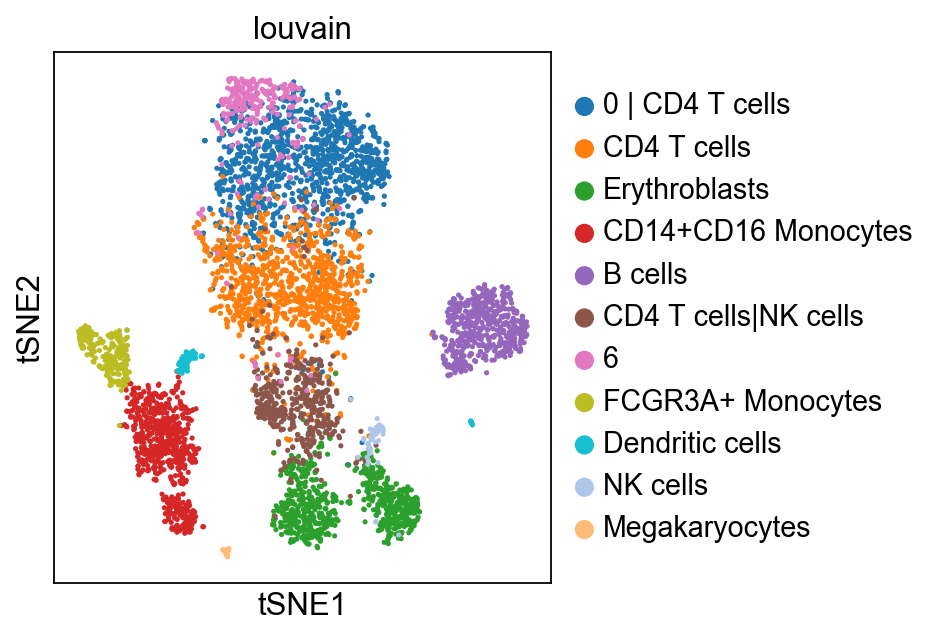

In [107]:
sc.pl.tsne(data_combined, color='louvain',legend_loc='right margin')

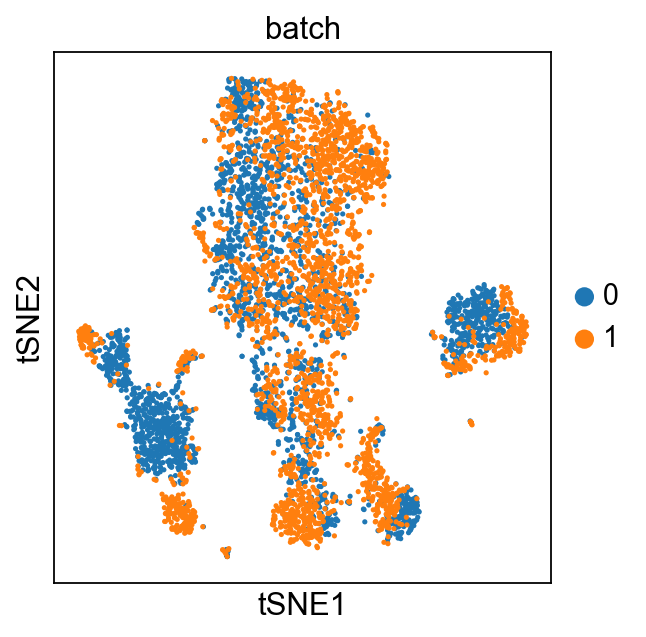

In [108]:
sc.pl.tsne(data_combined, color=['batch'], legend_loc='right margin')

<font color=red><B>2) Which PCs are most correlated with cell type and which with dataset of origin?</font>

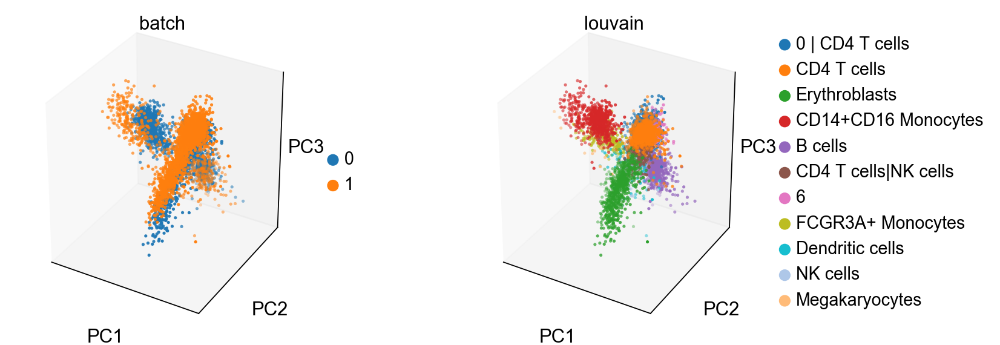

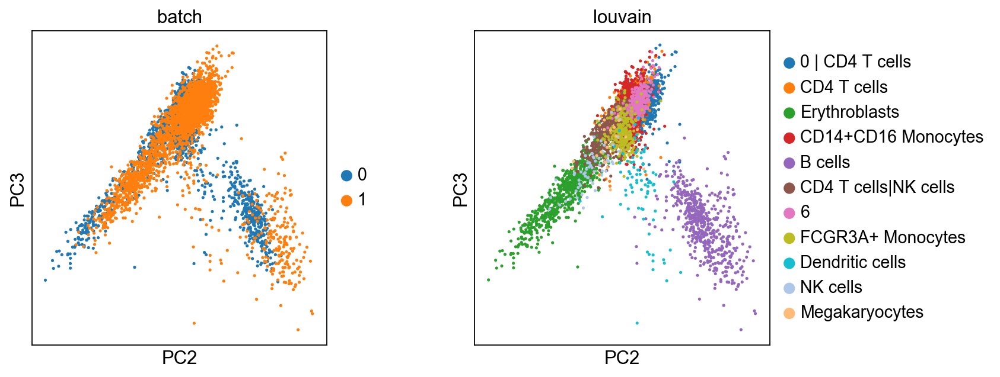

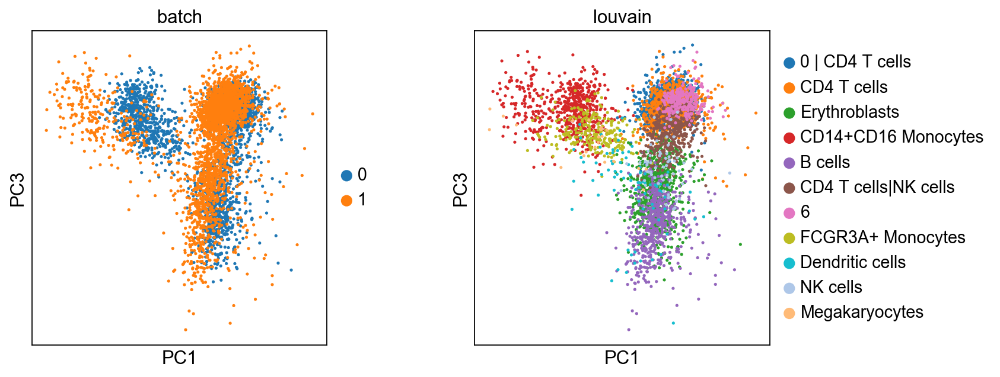

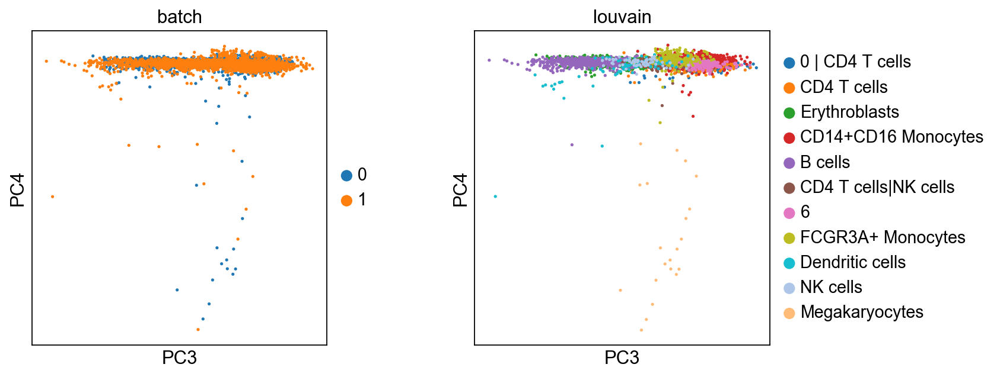

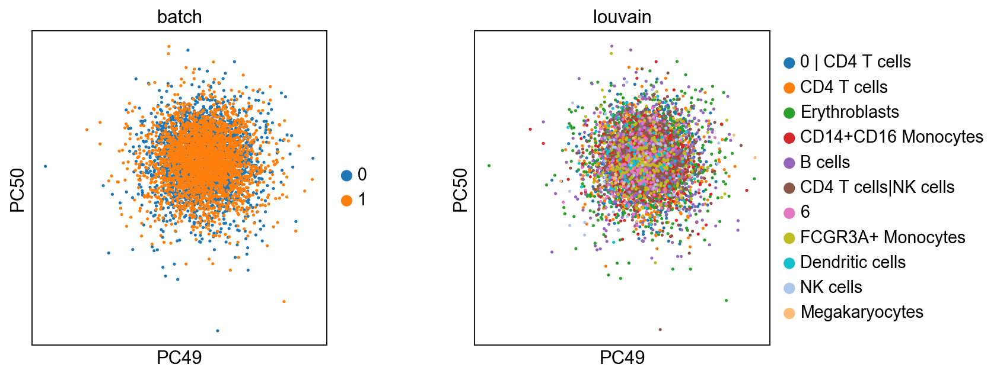

In [109]:
sc.pl.pca_scatter(data_combined, color=['batch','louvain'], projection='3d')
sc.pl.pca_scatter(data_combined, color=['batch','louvain'],components=[2,3])
sc.pl.pca_scatter(data_combined, color=['batch','louvain'],components=[1,3])
sc.pl.pca_scatter(data_combined, color=['batch','louvain'],components=[3,4])
sc.pl.pca_scatter(data_combined, color=['batch','louvain'],components=[49,50])